## ARI3129 - Advanced Computer Vision for AI

### Group Project

#### Karl Cini - 136975M

In [1]:
# Loading libraries

from time import time as time
import tensorflow as tf
import os
import pandas as pd

import keras
import matplotlib.pyplot as plt
import seaborn as sns
from keras import datasets, layers, models

from IPython.display import Image, display


from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

print(tf.config.list_physical_devices('GPU'))

2024-01-12 20:59:09.611118: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-12 20:59:09.634950: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-12 20:59:09.634969: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-12 20:59:09.635668: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-12 20:59:09.639474: I tensorflow/core/platform/cpu_feature_guar

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


2024-01-12 20:59:10.917690: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-12 20:59:10.945451: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-12 20:59:10.945595: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [2]:
#import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    tf.config.set_visible_devices(physical_devices[0], 'GPU')
    print("GPU is available and configured.")
else:
    print("No GPU detected.")

GPU is available and configured.


### **Task 1**: Object Classification

**Objective**:  *Comparison of Classification on three architectures trained on ImageNet* <br>
**Brief**: *You are required to use pre-trained models in the Keras Applications API using the Imagenet weights to carry out the classification of images. This task involves using two pre-trained architectures of your choice and comparing their performance on classifying images that contain a pizza.*

For this task I have sourced a classification dataset on the data repository 'Kaggle'.  <br>
*https://www.kaggle.com/datasets/carlosrunner/pizza-not-pizza*

All images were rescaled by the author to have a maximum side length of 512 pixels.

This is a subset of the Food-101 dataset. Information about the original dataset can be found in the following paper:
Bossard, Lukas, Matthieu Guillaumin, and Luc Van Gool. "Food-101 – Mining Discriminative Components with Random Forests." In European conference on computer vision, pp. 446-461. Springer, Cham, 2014.

The original dataset can be found in the following locations:
https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/
https://www.kaggle.com/datasets/dansbecker/food-101
https://paperswithcode.com/dataset/food-101
https://www.tensorflow.org/datasets/catalog/food101

Number of instances in each class:
Pizza: 983
Not Pizza: 983

In [3]:
pizza_dir = '/home/kcini75/Notebooks/ARI3129_Computer_vision/pizza_not_pizza'

BATCH_SIZE = 32
IMG_SIZE = (160, 160)

dataset = tf.keras.utils.image_dataset_from_directory(pizza_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)

Found 1967 files belonging to 2 classes.


2024-01-12 20:59:11.018738: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-12 20:59:11.018908: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-12 20:59:11.018991: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

In [4]:
dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

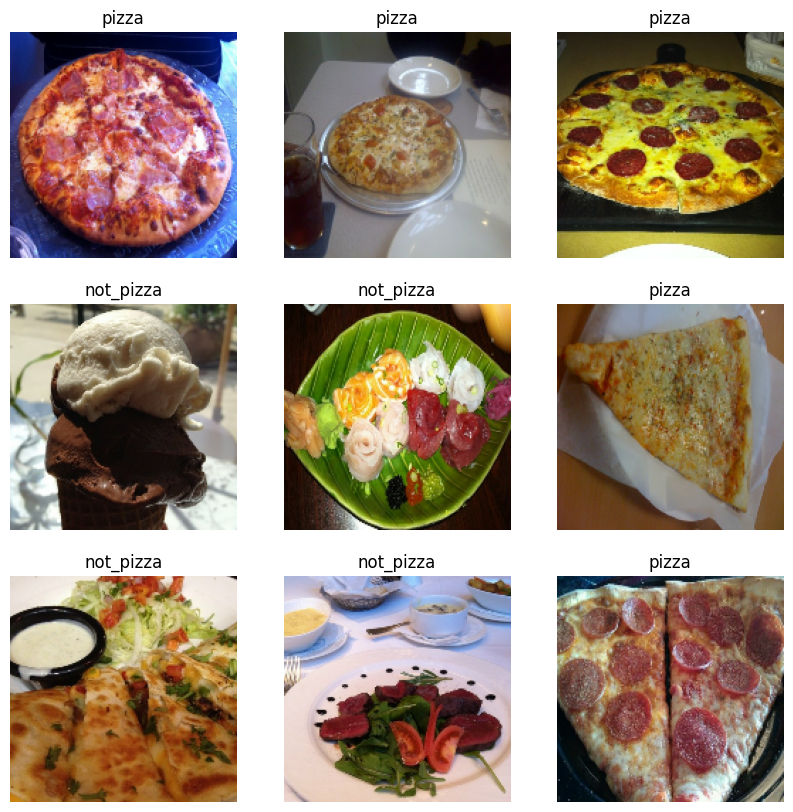

In [5]:
class_names = dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [6]:
# adapted from https://towardsdatascience.com/how-to-split-a-tensorflow-dataset-into-train-validation-and-test-sets-526c8dd29438

def get_dataset_partitions_tf(ds, ds_size, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    if shuffle:
        # Specify seed to always have the same split distribution between runs
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [7]:
dataset_size = tf.data.experimental.cardinality(dataset).numpy()

In [8]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset,dataset_size)

In [9]:
# Checking content of each dataset

def check_dataset(dataset):
    
    # Extracting the labels and find unique classes
    unique_classes = set()
    
    for _, labels in dataset:
        unique_classes.update(labels.numpy().tolist())
    
    num_classes = len(unique_classes)
    
    print(f"Number of classes: {num_classes}")
    print("Unique classes:", unique_classes)

    # Create a dictionary to store class counts
    class_counts = {}
    total_records = 0

    # Iterate through the dataset and count occurrences of each class
    for _, labels in dataset:
        labels_list = labels.numpy().tolist()
    
        for label in labels_list:
            if label not in class_counts:
                class_counts[label] = 1
                total_records += 1
            else:
                class_counts[label] += 1
                total_records += 1

    # Print the class counts
    print(f'Total Records: {total_records}')
    print("Class Counts:")
    for label, count in class_counts.items():
        print(f"Class {label}: {count} records")

In [10]:
check_dataset(train_ds)

Number of classes: 2
Unique classes: {0, 1}
Total Records: 1568
Class Counts:
Class 0: 778 records
Class 1: 790 records


In [11]:
check_dataset(val_ds)

Number of classes: 2
Unique classes: {0, 1}
Total Records: 192
Class Counts:
Class 0: 88 records
Class 1: 104 records


In [12]:
check_dataset(test_ds)

Number of classes: 2
Unique classes: {0, 1}
Total Records: 224
Class Counts:
Class 1: 118 records
Class 0: 106 records


In [13]:
AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_ds.prefetch(buffer_size=AUTOTUNE)
validation_dataset = val_ds.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_ds.prefetch(buffer_size=AUTOTUNE)

#### Augmenting the data

In [14]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

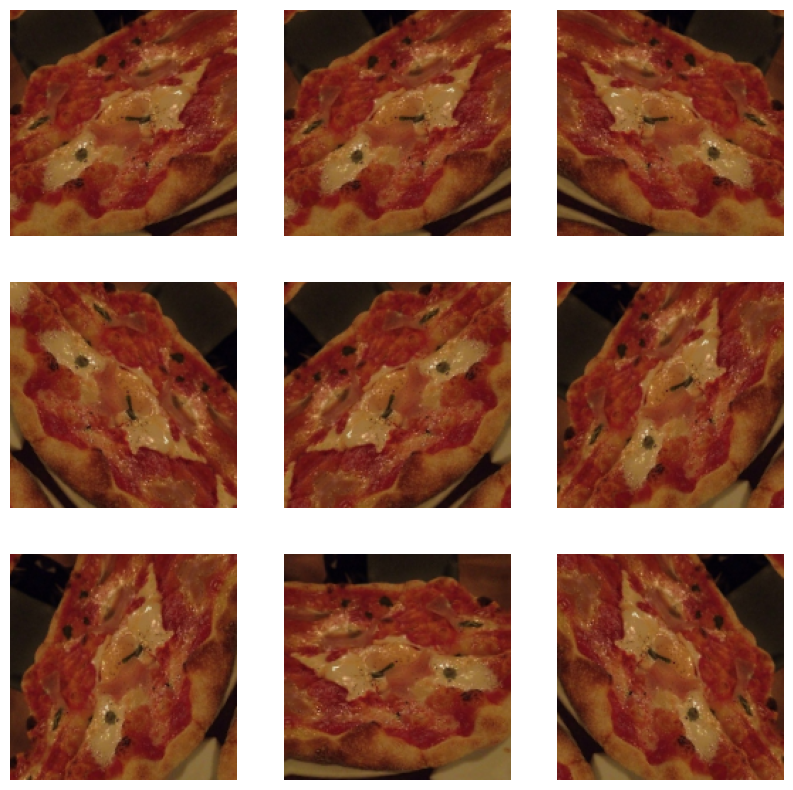

In [15]:
for image, _ in train_dataset.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

#### Rescaling pixel values

In [16]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [17]:
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

#### Loading the base model

In [18]:
# Create the base model from the pre-trained model MobileNet V2
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                              include_top=False,
                                              weights='imagenet')

In [19]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

2024-01-12 20:59:15.519729: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2024-01-12 20:59:15.561679: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


(32, 5, 5, 1280)


In [20]:
base_model.trainable = False

#### Adding a classification head

In [21]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [22]:
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


In [23]:
# Building model architecture

inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.1)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

#### Compiling the model

In [24]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[tf.keras.metrics.BinaryAccuracy(threshold=0, name='accuracy')])

#### Train the model

In [25]:
initial_epochs = 10

loss0, accuracy0 = model.evaluate(validation_dataset)

6/6 [==============================] - 1s 14ms/step - loss: 0.8529 - accuracy: 0.5625


In [26]:
print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

initial loss: 0.85
initial accuracy: 0.56


In [27]:
history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset)

Epoch 1/10
 5/49 [==>...........................] - ETA: 0s - loss: 0.8427 - accuracy: 0.5000  

2024-01-12 20:59:19.030905: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fd23c4caa60 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-01-12 20:59:19.030923: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Ti, Compute Capability 8.6
2024-01-12 20:59:19.034294: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1705089559.089010  106382 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


49/49 [==============================] - 3s 20ms/step - loss: 0.7107 - accuracy: 0.5918 - val_loss: 0.6274 - val_accuracy: 0.6562
Epoch 2/10
49/49 [==============================] - 1s 22ms/step - loss: 0.5665 - accuracy: 0.7260 - val_loss: 0.4890 - val_accuracy: 0.7886
Epoch 3/10
49/49 [==============================] - 1s 20ms/step - loss: 0.4849 - accuracy: 0.7898 - val_loss: 0.4013 - val_accuracy: 0.8438
Epoch 4/10
49/49 [==============================] - 1s 20ms/step - loss: 0.4163 - accuracy: 0.8356 - val_loss: 0.3248 - val_accuracy: 0.8802
Epoch 5/10
49/49 [==============================] - 1s 20ms/step - loss: 0.3783 - accuracy: 0.8591 - val_loss: 0.2924 - val_accuracy: 0.9115
Epoch 6/10
49/49 [==============================] - 1s 20ms/step - loss: 0.3508 - accuracy: 0.8640 - val_loss: 0.3151 - val_accuracy: 0.8906
Epoch 7/10
49/49 [==============================] - 1s 20ms/step - loss: 0.3107 - accuracy: 0.8975 - val_loss: 0.2384 - val_accuracy: 0.9427
Epoch 8/10
49/49 [======

#### Plotting learning curves

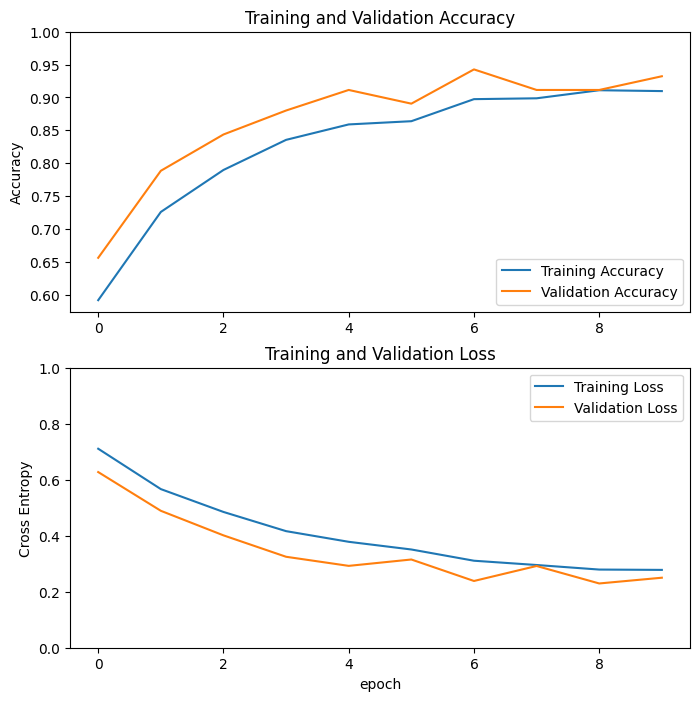

In [28]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

### **Task 2**: Building a Dataset

**Objective**:  
- *Building a dataset of pizza images together with annotations to be subsequently used for training an object detector* <br>

**Brief**:
- *Using the ImageNet pizza images together with images from other sources, prepare a dataset to train a custom object detector* <br>
- *This needs to include labelling and data augmentation as applicable.* <br>
- *You are also encouraged to include your images of pizza.  Roboflow and V7 Labs can be used in thisprocess.* <br>



### **Task 3**: Object Detection/Localization

**Objective**:
- *Training and evaluating object detectors* <br>

**Brief**:
- *1. Train any object detector you choose to detect pizza and toppings in an image using Tensorflow and/or PyTorch.* <br>
- *2. Repeat the training process on a second object detector.* <br>
- *3. Evaluate and compare the performance of the models using tools like Tensorboard and code-based metrics.* <br>
- *4. Following the detection, you are expected to provide analytics of the input image by specifying the number of toppings and other information you can provide from your process.* <br>
.

### **Faster R-CNN**

The first model I will use is the Fast R-CNN implemented in Pytorch. ChatGPT considers this model to have the advantage of being a widely used and well-established object detection model. It has a good balance between accuracy and speed. The region proposal network (RPN) used in Faster R-CNN helps in efficiently proposing potential regions for objects, making it effective for various object detection tasks. The code implementation has been adapted to this task from the excellent step by step tutorial by Neeraj Krishna [1]

In [29]:
%load_ext autoreload
%autoreload 2

In [30]:
import numpy as np
from skimage import io
from skimage.transform import resize
from sklearn.metrics import jaccard_score # intersection over union
import matplotlib.pyplot as plt
import random
import matplotlib.patches as patches
from utils import *
from model import *
import os

import torch
import torchvision
from torchvision import ops
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils.rnn import pad_sequence

In [31]:
if torch.cuda.is_available():
    # Get the number of available GPUs
    num_gpus = torch.cuda.device_count()

    print(f"Number of available GPUs: {num_gpus}")

    # Get the index of the current GPU
    current_gpu_index = torch.cuda.current_device()
    print(f"Current GPU index: {current_gpu_index}")

    # Get the name of the current GPU
    current_gpu_name = torch.cuda.get_device_name(current_gpu_index)
    print(f"Current GPU name: {current_gpu_name}")

else:
    print("CUDA (GPU support) is not available. Using CPU.")

Number of available GPUs: 1
Current GPU index: 0
Current GPU name: NVIDIA GeForce RTX 3060 Ti


#### Loading images

In [32]:
class ObjectDetectionDataset(Dataset):
    '''
    A Pytorch Dataset class to load the images and their corresponding annotations.
    
    Returns
    ------------
    images: torch.Tensor of size (B, C, H, W)
    gt bboxes: torch.Tensor of size (B, max_objects, 4)
    gt classes: torch.Tensor of size (B, max_objects)
    '''
    def __init__(self, annotation_path, img_dir, img_size, name2idx):
        self.annotation_path = annotation_path
        self.img_dir = img_dir
        self.img_size = img_size
        self.name2idx = name2idx
        
        self.img_data_all, self.gt_bboxes_all, self.gt_classes_all = self.get_data()
        
    def __len__(self):
        return self.img_data_all.size(dim=0)
    
    def __getitem__(self, idx):
        return self.img_data_all[idx], self.gt_bboxes_all[idx], self.gt_classes_all[idx]
        
    def get_data(self):
        img_data_all = []
        gt_idxs_all = []
        
        gt_boxes_all, gt_classes_all, img_paths = parse_annotation(self.annotation_path, self.img_dir, self.img_size)

        # to check if all tensors are same size (checking that all images are annotated)
        for tensor, cl, path in zip(gt_boxes_all, gt_classes_all, img_paths):
            if tensor.ndim != 2:
                print(tensor.size(), path, cl)

        
        for i, img_path in enumerate(img_paths):
            #print(img_path)
            
            # skip if the image path is not valid
            if (not img_path) or (not os.path.exists(img_path)):
                continue
                
            # read and resize image
            img = io.imread(img_path)
            img = resize(img, self.img_size)
            
            # convert image to torch tensor and reshape it so channels come first
            img_tensor = torch.from_numpy(img).permute(2, 0, 1)
            
            # encode class names as integers
            gt_classes = gt_classes_all[i]
            gt_idx = torch.Tensor([self.name2idx[name] for name in gt_classes])
            
            img_data_all.append(img_tensor)
            gt_idxs_all.append(gt_idx)

        for tensor in gt_boxes_all:
            if tensor.ndim != 2:
                print(tensor)
                print(tensor.size())

        
        # pad bounding boxes and classes so they are of the same size
        gt_bboxes_pad = pad_sequence(gt_boxes_all, batch_first=True, padding_value=-1)
        gt_classes_pad = pad_sequence(gt_idxs_all, batch_first=True, padding_value=-1)
        
        # stack all images
        img_data_stacked = torch.stack(img_data_all, dim=0)
        
        return img_data_stacked.to(dtype=torch.float32), gt_bboxes_pad, gt_classes_pad

#### Converting COCO json to CVAT xml

In [33]:
# Chat GPT

import json
import xml.etree.ElementTree as ET
from xml.dom import minidom

def coco_to_cvat(coco_json_path, cvat_xml_path):
    with open(coco_json_path, 'r') as json_file:
        coco_data = json.load(json_file)

    cvat_meta = coco_data.get('info', {})
    cvat_labels = [{'name': cat['name'], 'color': '#FFFFFF', 'attributes': {}} for cat in coco_data.get('categories', [])]
    cvat_images = coco_data.get('images', [])
    cvat_annotations = coco_data.get('annotations', [])

    cvat_root = ET.Element('annotations')
    cvat_version = ET.SubElement(cvat_root, 'version')
    cvat_version.text = '1.1'

    cvat_meta_elem = ET.SubElement(cvat_root, 'meta')
    cvat_task_elem = ET.SubElement(cvat_meta_elem, 'task')

    for key, value in cvat_meta.items():
        element = ET.SubElement(cvat_task_elem, key)
        element.text = str(value)

    labels_elem = ET.SubElement(cvat_task_elem, 'labels')
    for label in cvat_labels:
        label_elem = ET.SubElement(labels_elem, 'label')
        for key, value in label.items():
            label_key_elem = ET.SubElement(label_elem, key)
            label_key_elem.text = str(value)

    for image in cvat_images:
        image_elem = ET.SubElement(cvat_root, 'image', id=str(image['id']), name=image['file_name'], width=str(image['width']), height=str(image['height']))
        for annotation in cvat_annotations:
            if annotation['image_id'] == image['id']:
                box_elem = ET.SubElement(image_elem, 'box', label=cvat_labels[annotation['category_id']]['name'], occluded='0', source='manual')
                box_elem.set('xtl', str(annotation['bbox'][0]))
                box_elem.set('ytl', str(annotation['bbox'][1]))
                box_elem.set('xbr', str(annotation['bbox'][0] + annotation['bbox'][2]))
                box_elem.set('ybr', str(annotation['bbox'][1] + annotation['bbox'][3]))
                box_elem.set('z_order', '0')

    xml_string = ET.tostring(cvat_root, encoding='utf-8')
    pretty_xml_string = minidom.parseString(xml_string).toprettyxml(indent="    ")

    with open(cvat_xml_path, 'w') as xml_file:
        xml_file.write(pretty_xml_string)



In [34]:
# Specifying location of coco.json files for training, validation and testing sets

COCO_DIR = '/home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/coco_format' # adjust as necessary

annot_json_train = COCO_DIR + "/train/_annotations.coco.json"
annot_json_valid = COCO_DIR + "/valid/_annotations.coco.json"
annot_json_test = COCO_DIR + "/test/_annotations.coco.json"

In [35]:
# Converting existing json files to xml

# For training set
coco_to_cvat(annot_json_train, COCO_DIR + "/train/_annotations.xml")

# For validation set
coco_to_cvat(annot_json_valid, COCO_DIR + "/valid/_annotations.xml")

# For testing set
coco_to_cvat(annot_json_test, COCO_DIR + "/test/_annotations.xml")

In [36]:
img_width = 640
img_height = 480
annotation_path = COCO_DIR + "/train/_annotations.xml"
image_dir = COCO_DIR + "/train/"
name2idx = {'pad': -1, 'pizza': 0, 'mushrooms': 1, 'pepperoni': 2, 'black_olives': 3, 'peppers': 4}
idx2name = {v:k for k, v in name2idx.items()}

In [37]:
valid_annot_path = COCO_DIR + "/valid/_annotations.xml"
valid_image_dir = COCO_DIR + "/valid/"

In [38]:
test_annot_path = COCO_DIR + "/test/_annotations.xml"
test_image_dir = COCO_DIR + "/test/"

#### Create dataset and dataloaders

In [39]:
# For training

In [40]:
od_dataset = ObjectDetectionDataset(annotation_path, image_dir, (img_height, img_width), name2idx)

In [41]:
od_dataloader = DataLoader(od_dataset, batch_size=4)

In [42]:
# For validation

In [43]:
valid_dataset = ObjectDetectionDataset(valid_annot_path, valid_image_dir, (img_height, img_width), name2idx)

In [44]:
valid_dataloader = DataLoader(valid_dataset, batch_size=4)

In [45]:
# For testing

In [46]:
test_dataset = ObjectDetectionDataset(test_annot_path, test_image_dir, (img_height, img_width), name2idx)

In [47]:
test_dataloader = DataLoader(test_dataset, batch_size=4)

#### Grab a batch for demo

In [48]:
for img_batch, gt_bboxes_batch, gt_classes_batch in od_dataloader:
    img_data_all = img_batch
    gt_bboxes_all = gt_bboxes_batch
    gt_classes_all = gt_classes_batch
    break
    
img_data_all = img_data_all[:2]
gt_bboxes_all = gt_bboxes_all[:2]
gt_classes_all = gt_classes_all[:2]

#### Display images and bounding boxes

In [49]:
# get class names
gt_class_1 = gt_classes_all[0].long()
gt_class_1 = [idx2name[idx.item()] for idx in gt_class_1]

gt_class_2 = gt_classes_all[1].long()
gt_class_2 = [idx2name[idx.item()] for idx in gt_class_2]


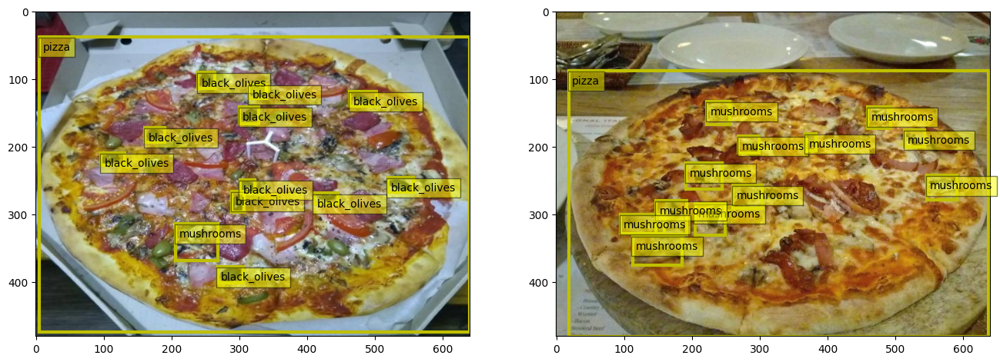

In [50]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)
fig, _ = display_bbox(gt_bboxes_all[0], fig, axes[0], classes=gt_class_1)
fig, _ = display_bbox(gt_bboxes_all[1], fig, axes[1], classes=gt_class_2)

#### Convolutional Backbone Network

In [51]:
# Using the first 8 layers from Resnet

model = torchvision.models.resnet50(weights='DEFAULT')#pretrained=True

In [52]:
req_layers = list(model.children())[:8]
backbone = nn.Sequential(*req_layers)

In [53]:
# unfreeze all the parameters
for param in backbone.named_parameters():
    param[1].requires_grad = True

In [54]:
# run the image through the backbone
out = backbone(img_data_all)

In [55]:
out_c, out_h, out_w = out.size(dim=1), out.size(dim=2), out.size(dim=3)

In [56]:
out_c, out_h, out_w

(2048, 15, 20)

In [57]:
# Checking how much the image has been down-scaled

width_scale_factor = img_width // out_w
height_scale_factor = img_height // out_h
height_scale_factor, width_scale_factor

(32, 32)

#### Visualizing feature maps

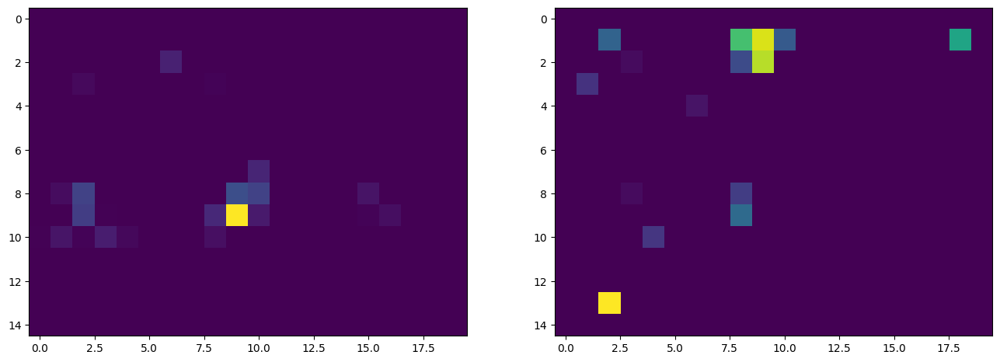

In [58]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

filters_data =[filters[0].detach().numpy() for filters in out[:2]]

fig, axes = display_img(filters_data, fig, axes)

#### Generate and Plot Anchor Points

In [59]:
anc_pts_x, anc_pts_y = gen_anc_centers(out_size=(out_h, out_w))

#### Display Grid Mapping

In [60]:
# project anchor centers onto the original image
anc_pts_x_proj = anc_pts_x.clone() * width_scale_factor 
anc_pts_y_proj = anc_pts_y.clone() * height_scale_factor

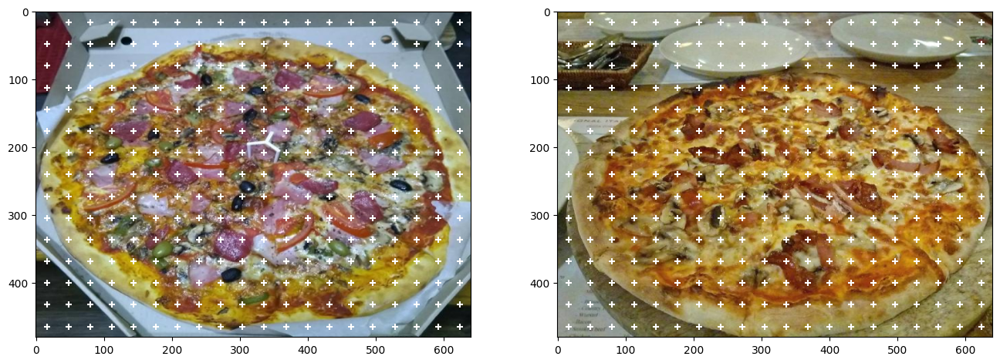

In [61]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))
 
fig, axes = display_img(img_data_all, fig, axes)
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0])
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1])

#### Create Anchor Boxes around Anchor points

In [62]:
anc_scales = [2, 4, 6]
anc_ratios = [0.5, 1, 1.5]
n_anc_boxes = len(anc_scales) * len(anc_ratios) # number of anchor boxes for each anchor point

anc_base = gen_anc_base(anc_pts_x, anc_pts_y, anc_scales, anc_ratios, (out_h, out_w))

In [63]:
# since all the images are scaled to the same size
# we can repeat the anchor base for all the images
anc_boxes_all = anc_base.repeat(img_data_all.size(dim=0), 1, 1, 1, 1)

#### Plot anchor boxes on a single anchor point

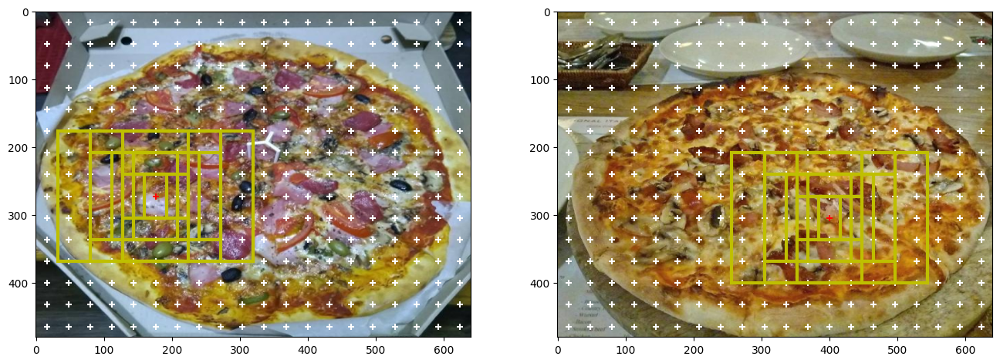

In [64]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# project anchor boxes to the image
anc_boxes_proj = project_bboxes(anc_boxes_all, width_scale_factor, height_scale_factor, mode='a2p')

# plot anchor boxes around selected anchor points
sp_1 = [5, 8]
sp_2 = [12, 9]
bboxes_1 = anc_boxes_proj[0][sp_1[0], sp_1[1]]
bboxes_2 = anc_boxes_proj[1][sp_2[0], sp_2[1]]

fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0], (anc_pts_x_proj[sp_1[0]], anc_pts_y_proj[sp_1[1]]))
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1], (anc_pts_x_proj[sp_2[0]], anc_pts_y_proj[sp_2[1]]))
fig, _ = display_bbox(bboxes_1, fig, axes[0])
fig, _ = display_bbox(bboxes_2, fig, axes[1])

#### Plot all anchor boxes

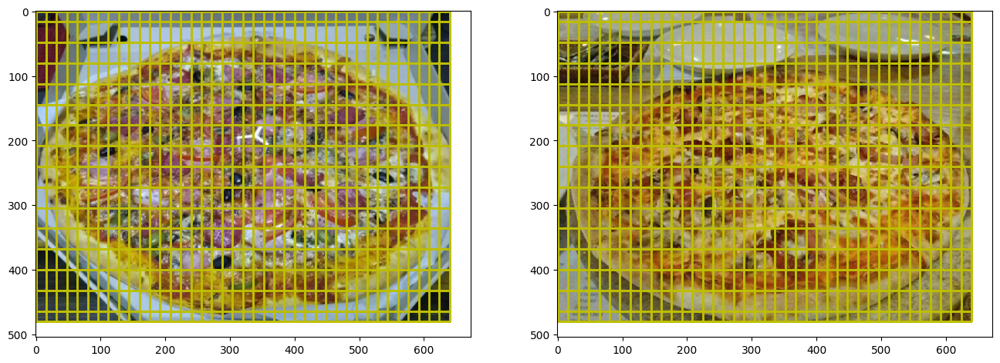

In [65]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# plot feature grid
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[0])
fig, _ = display_grid(anc_pts_x_proj, anc_pts_y_proj, fig, axes[1])

# plot all anchor boxes
for x in range(anc_pts_x_proj.size(dim=0)):
    for y in range(anc_pts_y_proj.size(dim=0)):
        bboxes = anc_boxes_proj[0][x, y]
        fig, _ = display_bbox(bboxes, fig, axes[0], line_width=1)
        fig, _ = display_bbox(bboxes, fig, axes[1], line_width=1)

#### Get Positive and Negative Anchors

In [66]:
pos_thresh = 0.8 # changed from 0.7
neg_thresh = 0.2 # changed from 0.3

# project gt bboxes onto the feature map
gt_bboxes_proj = project_bboxes(gt_bboxes_all, width_scale_factor, height_scale_factor, mode='p2a')

In [67]:
positive_anc_ind, negative_anc_ind, GT_conf_scores, \
GT_offsets, GT_class_pos, positive_anc_coords, \
negative_anc_coords, positive_anc_ind_sep = get_req_anchors(anc_boxes_all, gt_bboxes_proj, gt_classes_all, pos_thresh, neg_thresh)

#### Visualize positive anchor coordinates

In [68]:
# project anchor coords to the image space
pos_anc_proj = project_bboxes(positive_anc_coords, width_scale_factor, height_scale_factor, mode='a2p')
neg_anc_proj = project_bboxes(negative_anc_coords, width_scale_factor, height_scale_factor, mode='a2p')

# grab +ve and -ve anchors for each image separately

anc_idx_1 = torch.where(positive_anc_ind_sep == 0)[0]
anc_idx_2 = torch.where(positive_anc_ind_sep == 1)[0]

pos_anc_1 = pos_anc_proj[anc_idx_1]
pos_anc_2 = pos_anc_proj[anc_idx_2]

neg_anc_1 = neg_anc_proj[anc_idx_1]
neg_anc_2 = neg_anc_proj[anc_idx_2]

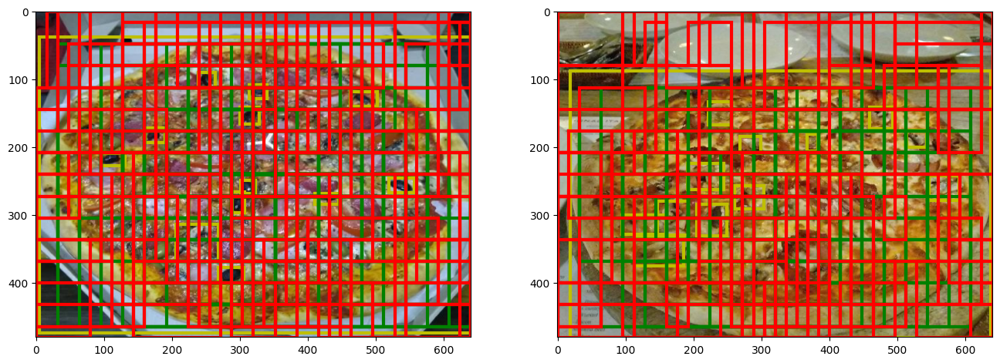

In [69]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_data_all, fig, axes)

# plot groundtruth bboxes
fig, _ = display_bbox(gt_bboxes_all[0], fig, axes[0])
fig, _ = display_bbox(gt_bboxes_all[1], fig, axes[1])

# plot positive anchor boxes
fig, _ = display_bbox(pos_anc_1, fig, axes[0], color='g')
fig, _ = display_bbox(pos_anc_2, fig, axes[1], color='g')

# plot negative anchor boxes
fig, _ = display_bbox(neg_anc_1, fig, axes[0], color='r')
fig, _ = display_bbox(neg_anc_2, fig, axes[1], color='r')

#### Building the model

In [70]:
img_size = (img_height, img_width)
out_size = (out_h, out_w)
n_classes = len(name2idx) - 1 # exclude pad idx
roi_size = (2, 2)

detector = TwoStageDetector(img_size, out_size, out_c, n_classes, roi_size)

In [71]:
detector.eval()
total_loss = detector(img_batch, gt_bboxes_batch, gt_classes_batch)
proposals_final, conf_scores_final, classes_final = detector.inference(img_batch)

#### Training loop

In [72]:
def validate(model, valid_dataloader):
    model.eval()
    total_loss = 0
    all_predictions = []
    all_ground_truth = []

    with torch.no_grad():
        for img_batch, gt_bboxes_batch, gt_classes_batch in valid_dataloader:
            # forward pass
            loss = model(img_batch, gt_bboxes_batch, gt_classes_batch)

            total_loss += loss.item()

           
    average_loss = total_loss / len(valid_dataloader)

    return average_loss


In [73]:
import time

In [74]:
def training_loop(model, learning_rate, train_dataloader, valid_dataloader, n_epochs):
    
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=0.0005)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1) 
    
    training_loss_list = []
    validation_loss_list = []

    for epoch in range(n_epochs):
        # Training
        model.train()
        total_loss = 0

        start_time = time.time()

        for img_batch, gt_bboxes_batch, gt_classes_batch in train_dataloader:
            # forward pass
            loss = model(img_batch, gt_bboxes_batch, gt_classes_batch)

            # backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        scheduler.step()
        
        end_time1 = time.time()
        
        average_train_loss = total_loss / len(train_dataloader)
        training_loss_list.append(average_train_loss)

        # Validation
        average_valid_loss = validate(model, valid_dataloader)
        validation_loss_list.append(average_valid_loss)

        end_time2 = time.time()

        epoch_time1 = end_time1 - start_time
        epoch_time2 = end_time2 - start_time

        print(f"Epoch {epoch + 1}/{n_epochs} => "
              f"Train Loss: {average_train_loss:.4f}, "
              f"Valid Loss: {average_valid_loss:.4f}, "
              f"Training Time - Epoch: {epoch_time1:.2f} seconds, "
              f"Total Time - Epoch: {epoch_time2:.2f} seconds"
        )

    return training_loss_list, validation_loss_list

In [75]:
learning_rate = 0.001
n_epochs = 15

train_loss, valid_loss = training_loop(detector, learning_rate, od_dataloader, valid_dataloader, n_epochs)

Epoch 1/15 => Train Loss: 443.9795, Valid Loss: 353.3227, Training Time - Epoch: 365.54 seconds, Total Time - Epoch: 379.01 seconds
Epoch 2/15 => Train Loss: 350.9702, Valid Loss: 352.7865, Training Time - Epoch: 364.21 seconds, Total Time - Epoch: 377.78 seconds
Epoch 3/15 => Train Loss: 344.9145, Valid Loss: 332.6459, Training Time - Epoch: 362.69 seconds, Total Time - Epoch: 376.28 seconds
Epoch 4/15 => Train Loss: 336.5993, Valid Loss: 322.3498, Training Time - Epoch: 364.26 seconds, Total Time - Epoch: 377.80 seconds
Epoch 5/15 => Train Loss: 326.9340, Valid Loss: 308.9958, Training Time - Epoch: 364.95 seconds, Total Time - Epoch: 378.93 seconds
Epoch 6/15 => Train Loss: 323.2418, Valid Loss: 298.2650, Training Time - Epoch: 364.25 seconds, Total Time - Epoch: 377.86 seconds
Epoch 7/15 => Train Loss: 319.8947, Valid Loss: 287.8054, Training Time - Epoch: 364.75 seconds, Total Time - Epoch: 378.38 seconds
Epoch 8/15 => Train Loss: 315.9830, Valid Loss: 282.6591, Training Time - Ep

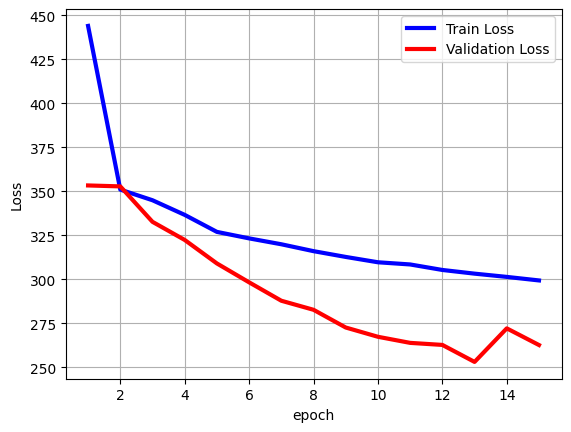

In [76]:
(fig, ax) = plt.subplots(1, 1)
ax.set_xlabel('epoch')
ax.set_ylabel('Loss')
ax.plot(range(1, len(train_loss) + 1), train_loss, color='blue', linestyle='-', linewidth=3, label='Train Loss');
ax.plot(range(1, len(valid_loss) + 1), valid_loss, color='red', linestyle='-', linewidth=3, label='Validation Loss');

# Adding legend
ax.legend()
ax.grid()

#### Saving model

In [77]:
torch.save(detector.state_dict(), "faster_rcnn_model_all_images_15epochs.pt")

#### **Loading saved model**

In [78]:
img_size = (img_height, img_width)
out_size = (out_h, out_w)
n_classes = len(name2idx) - 1 # exclude pad idx
roi_size = (2, 2)

detector = TwoStageDetector(img_size, out_size, out_c, n_classes, roi_size)
detector.load_state_dict(torch.load('faster_rcnn_model_all_images_15epochs.pt'))
detector.eval()

TwoStageDetector(
  (rpn): RegionProposalNetwork(
    (feature_extractor): FeatureExtractor(
      (backbone): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (4): Sequential(
          (0): Bottleneck(
            (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.

#### Inference

In [79]:
# Extracting predicted bounding boxes, predicted classes and confidence scores for each image

proposals_final, conf_scores_final, classes_final = [], [], []
gt_bboxes_test, gt_classes_test = [], []
test_images_all = []

for img_batch, gt_bboxes_batch, gt_classes_batch in test_dataloader:
    proposal_batch, confidence_score_batch, class_batch = detector.inference(img_batch, conf_thresh=0.85, nms_thresh=0.3)
    proposals_final.append(proposal_batch)
    conf_scores_final.append(confidence_score_batch)
    gt_bboxes_test.append(gt_bboxes_batch)
    gt_classes_test.append(gt_classes_batch)
    classes_final.append(class_batch)
    test_images_all.append(img_batch)

In [80]:
# Flattening arrays

test_images_all = [item for inner_list in test_images_all for item in inner_list]
proposals_final = [item for inner_list in proposals_final for item in inner_list]
conf_scores_final = [item for inner_list in conf_scores_final for item in inner_list]
classes_final = [item for inner_list in classes_final for item in inner_list]
gt_bboxes_test = [item for inner_list in gt_bboxes_test for item in inner_list]
gt_classes_test = [item for inner_list in gt_classes_test for item in inner_list]

In [81]:
# Removing padding from ground truth bboxes and classes

# Function to eliminate padding from a single tensor - gen ai
def eliminate_padding(tensor):
    return tensor[(tensor != -1).all(dim=1)]

def eliminate_padding_list(value_list):
    return value_list[value_list != -1]    

In [82]:
# Apply the function to each tensor in the ground truths

gt_bboxes_test = [eliminate_padding(tensor) for tensor in gt_bboxes_test]
gt_classes_test = [eliminate_padding_list(value_list) for value_list in gt_classes_test]

In [83]:
# Project proposals to the image space

prop_image_space = []

for prop in proposals_final:
    img_space_bbox = project_bboxes(prop, width_scale_factor, height_scale_factor, mode='a2p')
    prop_image_space.append(img_space_bbox)

In [84]:
# Get classes names

classes_names_final = []

for cls_tensor in classes_final:
    class_names = [idx2name[cls] for cls in cls_tensor.tolist()]
    classes_names_final.append(class_names)

#### **Evaluation metrics**

The extracted predictions were filtered when inference was done by the model. The level of confidence chosen was 0.85. For the evaluation metrics I will be checking each predicted bounding box for each image together with the predicted class against the ground truth. This will be achieved by calculating the Intersection over Union score for every predicted bounding box against all ground truth bounding boxes. Where the intersection over union score is greater than 0.5 (meaning the overlapping area is at least 50% of the total of the area of the two bounding boxes) I will check the predicted class against the respective ground truth class. To calculate the precision and recall I will also consider true positives, false positives, false negatives and true negatives as defined below [3]:

- True Positive (TP) — Correct detection made by the model.
- False Positive (FP) — Incorrect detection made by the detector.
- False Negative (FN) — A Ground-truth missed (not detected) by the object detector.
- True Negative (TN) — This is the background region correctly not detected by the model. This metric is not used in object detection because such regions are not explicitly annotated when preparing the annotations.

#### Intersection over Union

In [85]:
# Function to calculate Intersection over Union - gen ai

# Compute Intersection over Union (IoU) for each pair of predicted and ground truth bounding boxes
def calculate_iou(box1, box2):
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2

    intersection_x = max(0, min(x1 + w1, x2 + w2) - max(x1, x2))
    intersection_y = max(0, min(y1 + h1, y2 + h2) - max(y1, y2))

    intersection_area = intersection_x * intersection_y
    union_area = w1 * h1 + w2 * h2 - intersection_area

    return intersection_area / union_area if union_area > 0 else 0

In [86]:
def images_ious(prediction_box, ground_truth_box):
    ious = np.zeros((len(prediction_box), len(ground_truth_box)))
    for i, pred_box in enumerate(prediction_box):
        for j, gt_box in enumerate(ground_truth_box):
            ious[i, j] = calculate_iou(pred_box.numpy(), gt_box)
    
    return ious

In [89]:
# Custom Function to calculate metrics

def calculate_metrics(predicted_bboxes, predicted_classes, ground_truth_bboxes, ground_truth_classes, iou_threshold):

    tp_pizza = np.zeros(len(predicted_bboxes))
    tp_mushrooms = np.zeros(len(predicted_bboxes))
    tp_pepperoni = np.zeros(len(predicted_bboxes))
    tp_black_olives = np.zeros(len(predicted_bboxes))
    tp_peppers = np.zeros(len(predicted_bboxes))

    precision_pizza = np.zeros(len(predicted_bboxes))
    precision_mushrooms = np.zeros(len(predicted_bboxes))
    precision_pepperoni = np.zeros(len(predicted_bboxes))
    precision_black_olives = np.zeros(len(predicted_bboxes))
    precision_peppers = np.zeros(len(predicted_bboxes))

    recall_pizza = np.zeros(len(predicted_bboxes))
    recall_mushrooms = np.zeros(len(predicted_bboxes))
    recall_pepperoni = np.zeros(len(predicted_bboxes))
    recall_black_olives = np.zeros(len(predicted_bboxes))
    recall_peppers = np.zeros(len(predicted_bboxes))

    all_detections_pizza = np.zeros(len(predicted_classes))
    all_ground_truths_pizza = np.zeros(len(ground_truth_bboxes))

    all_detections_mushrooms = np.zeros(len(predicted_classes))
    all_ground_truths_mushrooms = np.zeros(len(ground_truth_bboxes))

    all_detections_pepperoni = np.zeros(len(predicted_classes))
    all_ground_truths_pepperoni = np.zeros(len(ground_truth_bboxes))

    all_detections_black_olives = np.zeros(len(predicted_classes))
    all_ground_truths_black_olives = np.zeros(len(ground_truth_bboxes))

    all_detections_peppers = np.zeros(len(predicted_classes))
    all_ground_truths_peppers = np.zeros(len(ground_truth_bboxes))
 
    
    
    for p, (pb, gt) in enumerate(zip(predicted_bboxes, ground_truth_bboxes)):
        
        # Getting the respective predicted bounding boxes for each class
        pboxes_pizza = pb[torch.where(predicted_classes[p] == 0)]
        pboxes_mushrooms = pb[torch.where(predicted_classes[p] == 1)]
        pboxes_pepperoni = pb[torch.where(predicted_classes[p] == 2)]
        pboxes_black_olives = pb[torch.where(predicted_classes[p] == 3)]
        pboxes_peppers = pb[torch.where(predicted_classes[p] == 4)]

        # Getting the respective ground truth bounding boxes for each class
        gtboxes_pizza = gt[torch.where(ground_truth_classes[p] == 0)]
        gtboxes_mushrooms = gt[torch.where(ground_truth_classes[p] == 1)]
        gtboxes_pepperoni = gt[torch.where(ground_truth_classes[p] == 2)]
        gtboxes_black_olives = gt[torch.where(ground_truth_classes[p] == 3)]
        gtboxes_peppers = gt[torch.where(ground_truth_classes[p] == 4)]

        # Calculating IoUs for each class
           
        ious_pizza = images_ious(pboxes_pizza, gtboxes_pizza)
        ious_mushrooms = images_ious(pboxes_mushrooms, gtboxes_mushrooms)
        ious_pepperoni = images_ious(pboxes_pepperoni, gtboxes_pepperoni)
        ious_black_olives = images_ious(pboxes_black_olives, gtboxes_black_olives)
        ious_peppers = images_ious(pboxes_peppers, gtboxes_peppers)
            
        # checking ious of each prediction
        
        for i, iou in enumerate(ious_pizza): 
            score = np.max(iou) if len(iou) > 0 else 0
            if score >= iou_threshold:            
                tp_pizza[p] += 1

        for i, iou in enumerate(ious_mushrooms): 
            score = np.max(iou) if len(iou) > 0 else 0
            if score >= iou_threshold:            
                tp_mushrooms[p] += 1

        for i, iou in enumerate(ious_pepperoni): 
            score = np.max(iou) if len(iou) > 0 else 0
            if score >= iou_threshold:            
                tp_pepperoni[p] += 1

        for i, iou in enumerate(ious_black_olives): 
            score = np.max(iou) if len(iou) > 0 else 0
            if score >= iou_threshold:            
                tp_black_olives[p] += 1

        for i, iou in enumerate(ious_peppers): 
            score = np.max(iou) if len(iou) > 0 else 0
            if score >= iou_threshold:            
                tp_peppers[p] += 1


        all_detections_pizza[p] = len(predicted_classes[p][torch.where(predicted_classes[p] == 0)])
        all_ground_truths_pizza[p] = len(ground_truth_classes[p][torch.where(ground_truth_classes[p] == 0)])

        all_detections_mushrooms[p] = len(predicted_classes[p][torch.where(predicted_classes[p] == 1)])
        all_ground_truths_mushrooms[p] = len(ground_truth_classes[p][torch.where(ground_truth_classes[p] == 1)])

        all_detections_pepperoni[p] = len(predicted_classes[p][torch.where(predicted_classes[p] == 2)])
        all_ground_truths_pepperoni[p] = len(ground_truth_classes[p][torch.where(ground_truth_classes[p] == 2)])

        all_detections_black_olives[p] = len(predicted_classes[p][torch.where(predicted_classes[p] == 3)])
        all_ground_truths_black_olives[p] = len(ground_truth_classes[p][torch.where(ground_truth_classes[p] == 3)])

        all_detections_peppers[p] = len(predicted_classes[p][torch.where(predicted_classes[p] == 4)])
        all_ground_truths_peppers[p] = len(ground_truth_classes[p][torch.where(ground_truth_classes[p] == 4)])

        precision_pizza[p] = tp_pizza[p] / all_detections_pizza[p] if all_detections_pizza[p] != 0 else 0
        precision_mushrooms[p] = tp_mushrooms[p] / all_detections_mushrooms[p] if all_detections_mushrooms[p] != 0 else 0
        precision_pepperoni[p] = tp_pepperoni[p] / all_detections_pepperoni[p] if all_detections_pepperoni[p] != 0 else 0
        precision_black_olives[p] = tp_black_olives[p] / all_detections_black_olives[p] if all_detections_black_olives[p] != 0 else 0
        precision_peppers[p] = tp_peppers[p] / all_detections_pepperoni[p] if all_detections_pepperoni[p] != 0 else 0

        recall_pizza[p] = tp_pizza[p] / all_ground_truths_pizza[p] if all_ground_truths_pizza[p] != 0 else 0
        recall_mushrooms[p] = tp_mushrooms[p] / all_ground_truths_mushrooms[p] if all_ground_truths_mushrooms[p] != 0 else 0
        recall_pepperoni[p] = tp_pepperoni[p] / all_ground_truths_pepperoni[p] if all_ground_truths_pepperoni[p] != 0 else 0
        recall_black_olives[p] = tp_black_olives[p] / all_ground_truths_black_olives[p] if all_ground_truths_black_olives[p] != 0 else 0
        recall_peppers[p] = tp_peppers[p] / all_ground_truths_pepperoni[p] if all_ground_truths_pepperoni[p] != 0 else 0

        
    # Creating a dictionary to store results
    metrics =  {
    #'image': list(range(1,37)),
    'pizza': {'precision': precision_pizza, 'recall': recall_pizza},
    'mushrooms': {'precision': precision_mushrooms, 'recall': recall_mushrooms},
    'pepperoni': {'precision': precision_pepperoni, 'recall': recall_pepperoni},
    'black_olives': {'precision': precision_black_olives, 'recall': recall_black_olives},
    'peppers': {'precision': precision_peppers, 'recall': recall_peppers}
    }

    # Convert the dictionary to a DataFrame - https://stackoverflow.com/questions/24988131/nested-dictionary-to-multiindex-dataframe-where-dictionary-keys-are-column-label
    metrics_dict = {(outerKey, innerKey): values for outerKey, innerDict in metrics.items() for innerKey, values in innerDict.items()}
    metrics_df = pd.DataFrame(metrics_dict)

    # Change the index to start from 1 and title it as 'Image'
    metrics_df.index = metrics_df.index + 1
    metrics_df.index.name = 'Image'

    # Calculation of Precision and Recall for all images
    total_precision_pizza = np.sum(tp_pizza) / np.sum(all_detections_pizza)
    total_precision_mushrooms = np.sum(tp_mushrooms) / np.sum(all_detections_mushrooms)
    total_precision_pepperoni = np.sum(tp_pepperoni) / np.sum(all_detections_pepperoni)
    total_precision_black_olives = np.sum(tp_black_olives) / np.sum(all_detections_black_olives)
    total_precision_peppers = np.sum(tp_peppers) / np.sum(all_detections_peppers)

    total_recall_pizza = np.sum(tp_pizza) / np.sum(all_ground_truths_pizza)
    total_recall_mushrooms = np.sum(tp_mushrooms) / np.sum(all_ground_truths_mushrooms)
    total_recall_pepperoni = np.sum(tp_pepperoni) / np.sum(all_ground_truths_pepperoni)
    total_recall_black_olives = np.sum(tp_black_olives) / np.sum(all_ground_truths_black_olives)
    total_recall_peppers = np.sum(tp_peppers) / np.sum(all_ground_truths_peppers)

    print(f'Precision - Pizza - All images : {total_precision_pizza}')
    print(f'Precision - Mushrooms - All images : {total_precision_mushrooms}')
    print(f'Precision - Pepperoni - All images : {total_precision_pepperoni}')
    print(f'Precision - Black Olives - All images : {total_precision_black_olives}')
    print(f'Precision - Peppers - All images : {total_precision_peppers}')
    print()
    print(f'Recall - Pizza - All images : {total_recall_pizza}')
    print(f'Recall - Mushrooms - All images : {total_recall_mushrooms}')
    print(f'Recall - Pepperoni - All images : {total_recall_pepperoni}')
    print(f'Recall - Black Olives - All images : {total_recall_black_olives}')
    print(f'Recall - Peppers - All images : {total_recall_peppers}')


    return metrics_df

In [90]:
metrics_df = calculate_metrics(prop_image_space, classes_final, gt_bboxes_test, gt_classes_test,  0.5)

Precision - Pizza - All images : 0.1794871794871795
Precision - Mushrooms - All images : 0.21428571428571427
Precision - Pepperoni - All images : 0.25
Precision - Black Olives - All images : 0.12121212121212122
Precision - Peppers - All images : nan

Recall - Pizza - All images : 0.5833333333333334
Recall - Mushrooms - All images : 0.03550295857988166
Recall - Pepperoni - All images : 0.0481283422459893
Recall - Black Olives - All images : 0.022988505747126436
Recall - Peppers - All images : 0.0


In [91]:
metrics_df

pizza        mushrooms           pepperoni           black_olives  \
      precision recall precision    recall precision    recall    precision   
Image                                                                         
1      0.000000    0.0  0.000000  0.000000  1.000000  0.055556          0.0   
2      0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
3      0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.5   
4      0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
5      0.333333    1.0  1.000000  0.153846  0.000000  0.000000          0.0   
6      0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
7      0.500000    1.0  0.000000  0.000000  0.000000  0.000000          1.0   
8      0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
9      0.250000    1.0  0.000000  0.000000  1.000000  0.250000          0.0   
10     0.500000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
11     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
12     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
13     1.000000    1.0  0.000000  0.000000  0.333333  0.066667          0.0   
14     0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
15     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
16     0.333333    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
17     0.500000    1.0  0.000000  0.000000  0.666667  0.083333          0.0   
18     0.333333    1.0  0.666667  0.200000  0.000000  0.000000          0.0   
19     0.333333    1.0  0.000000  0.000000  0.000000  0.000000          1.0   
20     0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
21     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
22     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
23     0.250000    1.0  1.000000  0.037037  0.000000  0.000000          0.0   
24     0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
25     0.200000    1.0  0.000000  0.000000  1.000000  0.074074          0.0   
26     0.333333    1.0  0.000000  0.000000  0.500000  0.035714          0.0   
27     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
28     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
29     0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
30     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
31     0.333333    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
32     0.250000    1.0  0.000000  0.000000  0.000000  0.000000          0.0   
33     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
34     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   
35     0.333333    1.0  1.000000  0.090909  0.000000  0.000000          1.0   
36     0.000000    0.0  0.000000  0.000000  0.000000  0.000000          0.0   

                  peppers         
         recall precision recall  
Image                             
1      0.000000       0.0    0.0  
2      0.000000       0.0    0.0  
3      0.125000       0.0    0.0  
4      0.000000       0.0    0.0  
5      0.000000       0.0    0.0  
6      0.000000       0.0    0.0  
7      0.111111       0.0    0.0  
8      0.000000       0.0    0.0  
9      0.000000       0.0    0.0  
10     0.000000       0.0    0.0  
11     0.000000       0.0    0.0  
12     0.000000       0.0    0.0  
13     0.000000       0.0    0.0  
14     0.000000       0.0    0.0  
15     0.000000       0.0    0.0  
16     0.000000       0.0    0.0  
17     0.000000       0.0    0.0  
18     0.000000       0.0    0.0  
19     0.021277       0.0    0.0  
20     0.000000       0.0    0.0  
21     0.000000       0.0    0.0  
22     0.000000       0.0    0.0  
23     0.000000       0.0    0.0  
24     0.000000   

#### **Viewing sample of predicted bounding boxes**

In [92]:
# Extracting first 2 images from test set

for img_batch, gt_bboxes_batch, gt_classes_batch in test_dataloader:
    test_images = img_batch
    break

In [93]:
detector.eval()
proposals_final, conf_scores_final, classes_final = detector.inference(img_batch[:2], conf_thresh=0.85, nms_thresh=0.3)

In [94]:
# project proposals to the image space
prop_proj_1 = project_bboxes(proposals_final[0], width_scale_factor, height_scale_factor, mode='a2p')
prop_proj_2 = project_bboxes(proposals_final[1], width_scale_factor, height_scale_factor, mode='a2p')

# get classes
classes_pred_1 = [idx2name[cls] for cls in classes_final[0].tolist()]
classes_pred_2 = [idx2name[cls] for cls in classes_final[1].tolist()]

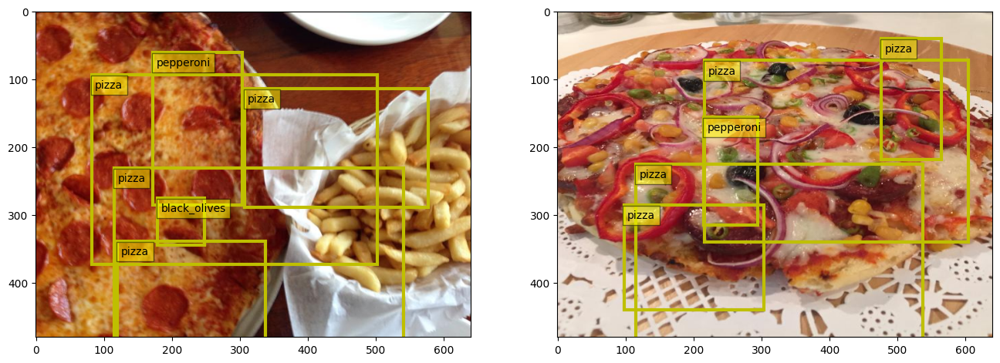

In [95]:
nrows, ncols = (1, 2)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 8))

fig, axes = display_img(img_batch[:2], fig, axes)
fig, _ = display_bbox(prop_proj_1, fig, axes[0], classes=classes_pred_1)
fig, _ = display_bbox(prop_proj_2, fig, axes[1], classes=classes_pred_2)

### **Yolo V8**

The second model architecture I will be using is YoloV8. The code below is based on and adapted from the Roboflow assistance notebook [2]

In [96]:
# the model was installed via pip - pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.9.18 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7971MiB)
Setup complete ✅ (16 CPUs, 46.9 GB RAM, 219.0/468.4 GB disk)


In [97]:
# Importing Libraries

from ultralytics import YOLO
from IPython.display import display, Image

In [98]:
YOLO_DIR = '/home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format'

In [99]:
CFG  = {
    'data': YOLO_DIR + '/data.yaml',
    'img_size': 640,
    'batch_size': 24,
    'epochs': 50,
    'mode': 'train',
    'seed': 554,
    'cosine': True,
    'resume': False,
    'freeze': 0, # number of layers to freeze
    'init_learning_rate': 1e-2,
    'dropout': 0.1, 
    'optimizer': 'auto' # choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
}

In [100]:
model = YOLO('yolov8s.pt')

In [101]:
# Train the model
results = model.train(data = CFG['data'],
                    epochs = CFG['epochs'],
                    imgsz = CFG['img_size'],
                    dropout = CFG['dropout'],
                    freeze = CFG['freeze'],
                    batch = CFG['batch_size'],
                      seed = CFG['seed'],
                      cos_lr = CFG['cosine'],
                      lr0 = CFG['init_learning_rate'],
                    optimizer =CFG['optimizer'],
                    )

New https://pypi.org/project/ultralytics/8.1.1 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.9.18 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7971MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/data.yaml, epochs=50, patience=50, batch=24, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=554, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=0, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_strid

In [102]:
results_path = '/home/kcini75/Notebooks/ARI3129_Computer_vision/runs/detect/train/'

In [103]:
results_df = pd.read_csv(results_path + 'results.csv')

In [104]:
# Strip whitespaces from column names
results_df.columns = results_df.columns.str.strip()

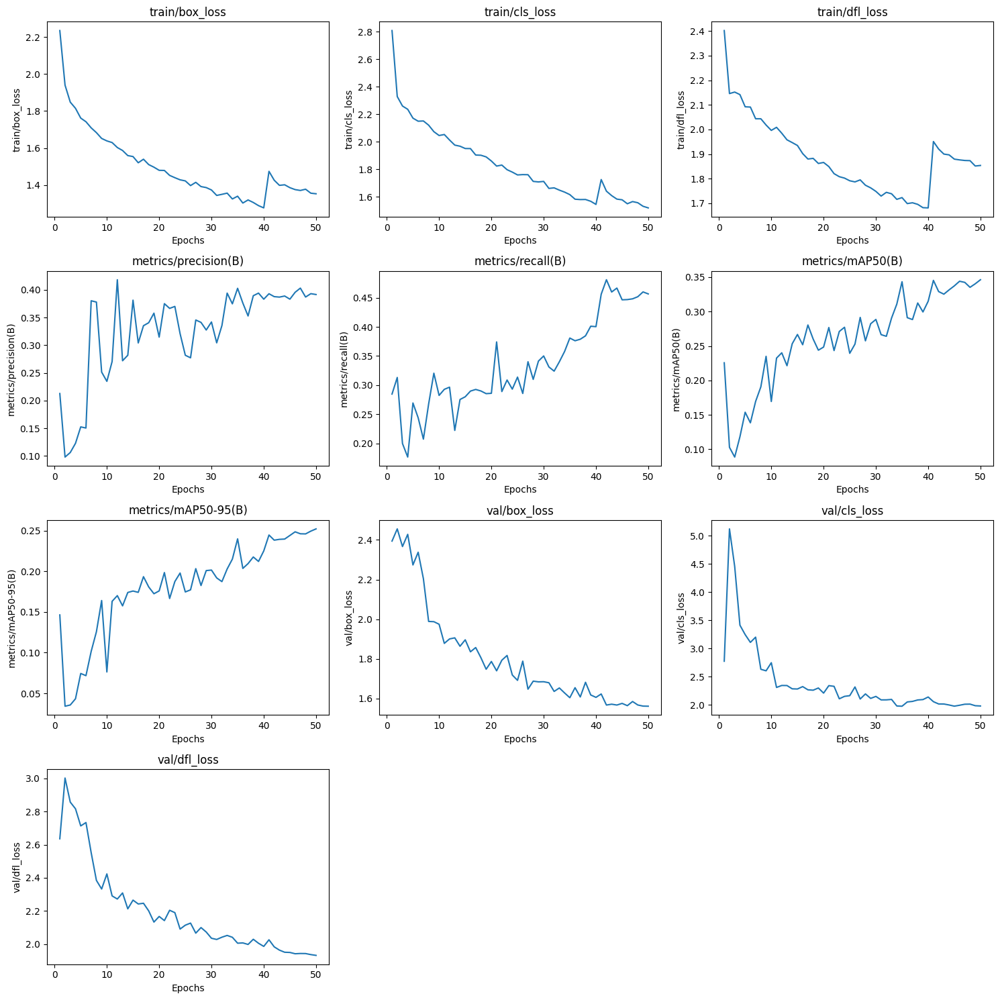

In [105]:
# Plotting
%matplotlib inline
plot_results = [x for x in results_df.columns if x not in ['epoch', 'lr/pg0',	'lr/pg1', 	'lr/pg2']]

# Set up subplots
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))

# Flatten axes for easier indexing
axes = axes.flatten()

# Plot each column against 'epoch'
for i, column in enumerate(plot_results):  # Skip 'epoch' column
    sns.lineplot(data=results_df, x='epoch', y=column, ax=axes[i]);
    axes[i].set_title(column)
    axes[i].set_xlabel('Epochs')
    axes[i].set_ylabel(column)


# Hide the last subplot in the 4th row
axes[10].set_visible(False)
axes[11].set_visible(False)


# Adjust layout
plt.tight_layout()
plt.show()

#### Validation

In [106]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

Ultralytics YOLOv8.0.196 🚀 Python-3.9.18 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7971MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/valid/labels.cache... 73 images, 0 backgrounds, 0 corrupt: 100%|██████████| 73/73 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.44it/s]
                   all         73       1609      0.393      0.456      0.345      0.252
          black_olives         73        442      0.353      0.552      0.322      0.179
             mushrooms         73        349       0.28      0.287      0.224      0.107
             pepperoni         73        481      0.229      0.428      0.216      0.113
               peppers         73        246      0.137      0.154     0.0939     0.0361
                 pizza         73      

array([    0.17942,     0.10691,     0.11314,    0.036145,     0.82648])

In [107]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd150339550>
fitness: 0.26166869668992226
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.17942,     0.10691,     0.11314,    0.036145,     0.82648])
names: {0: 'black_olives', 1: 'mushrooms', 2: 'pepperoni', 3: 'peppers', 4: 'pizza'}
plot: True
results_dict: {'metrics/precision(B)': 0.39270218994511863, 'metrics/recall(B)': 0.4557477208300364, 'metrics/mAP50(B)': 0.3449097493401087, 'metrics/mAP50-95(B)': 0.25241969083990157, 'fitness': 0.26166869668992226}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 0.2288426438423052, 'inference': 9.114170727664478, 'loss': 0.0004115169995451627, 'postprocess': 3.994259115767806}

In [108]:
best_epoch_model = YOLO('/home/kcini75/Notebooks/ARI3129_Computer_vision/runs/detect/train/weights/best.pt')

In [109]:
metrics_best = best_epoch_model.val()

Ultralytics YOLOv8.0.196 🚀 Python-3.9.18 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Ti, 7971MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/valid/labels.cache... 73 images, 0 backgrounds, 0 corrupt: 100%|██████████| 73/73 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.97it/s]
                   all         73       1609      0.393      0.456      0.345      0.252
          black_olives         73        442      0.353      0.552      0.322      0.179
             mushrooms         73        349       0.28      0.287      0.224      0.107
             pepperoni         73        481      0.228      0.428      0.216      0.113
               peppers         73        246      0.137      0.154     0.0939     0.0362
                 pizza         73      

#### Prediction on Test Set

In [110]:
# Making predictions on test set

source = YOLO_DIR + '/test/images'

yolo_predictions = model.predict(source, save=True, imgsz=640, conf=0.5)


image 1/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images/00282_jpg.rf.0d7a19998a975f9014eba6e67189999f.jpg: 640x640 1 pizza, 6.7ms
image 2/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images/00495_jpg.rf.0a1c5808ce75deec1dceb9e0e9c2380c.jpg: 640x640 1 pizza, 5.6ms
image 3/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images/00560_jpg.rf.47c8ad8caf00b3fc4394ba47458e111e.jpg: 640x640 1 pizza, 5.6ms
image 4/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images/00622_jpg.rf.36a9e1ec4330c806305de332bdd9a1c6.jpg: 640x640 1 pizza, 5.6ms
image 5/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images/00655_jpg.rf.3274d8bc4e67c891c57c5a2c1ca6bb82.jpg: 640x640 1 pizza, 5.6ms
image 6/36 /home/kcini75/Notebooks/ARI3129_Computer_vision/git_folder/datasets/yolov8_format/test/images

Image : 00282_jpg.rf.0d7a19998a975f9014eba6e67189999f.jpg


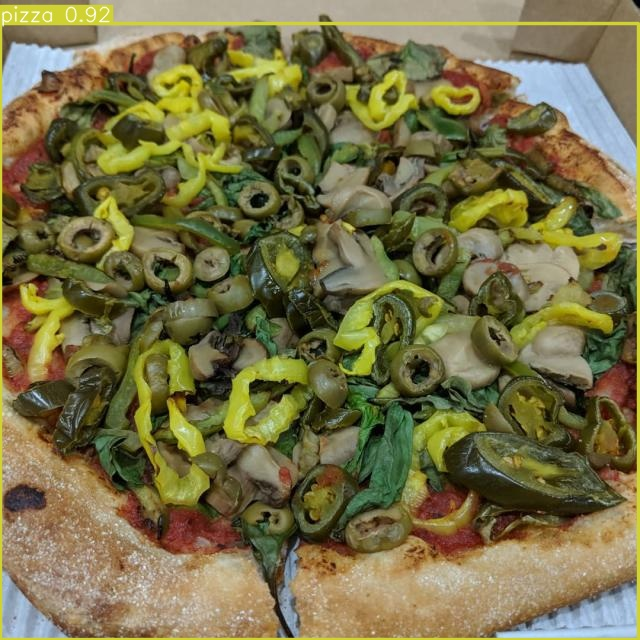

Objects detected : 1
Object type: pizza
Coordinates: [0.956298828125, 23.4967041015625, 638.8436279296875, 639.479248046875]
Probability: 0.918420135974884
-------------------------
Image : 00495_jpg.rf.0a1c5808ce75deec1dceb9e0e9c2380c.jpg


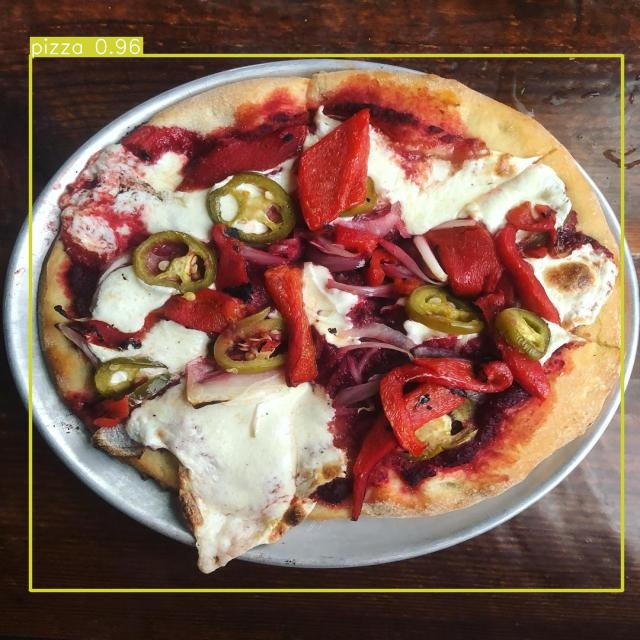

Objects detected : 1
Object type: pizza
Coordinates: [30.835205078125, 55.7889404296875, 622.06689453125, 590.0079345703125]
Probability: 0.9602090716362
-------------------------
Image : 00560_jpg.rf.47c8ad8caf00b3fc4394ba47458e111e.jpg


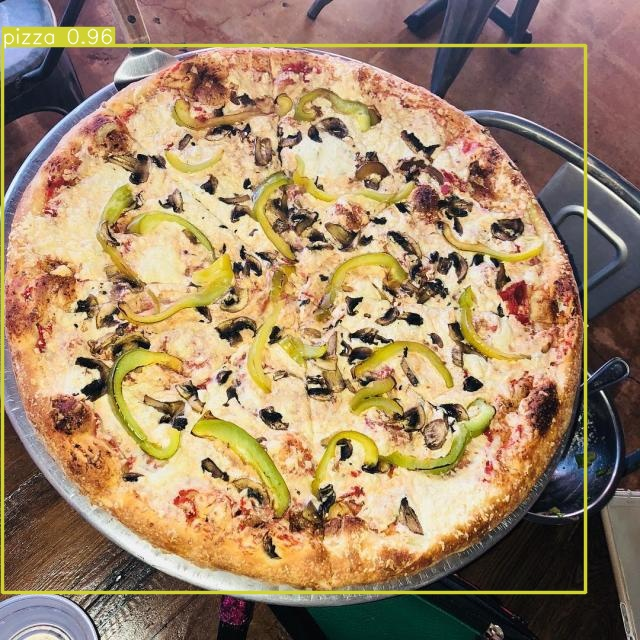

Objects detected : 1
Object type: pizza
Coordinates: [2.9385986328125, 45.199951171875, 585.7283935546875, 592.5172729492188]
Probability: 0.9637364745140076
-------------------------
Image : 00622_jpg.rf.36a9e1ec4330c806305de332bdd9a1c6.jpg


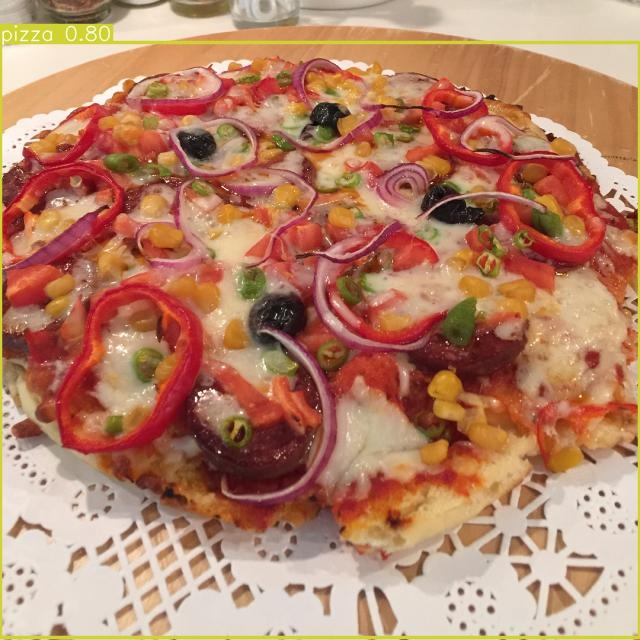

Objects detected : 1
Object type: pizza
Coordinates: [0.0, 42.988037109375, 639.6241455078125, 637.5248413085938]
Probability: 0.8017402291297913
-------------------------
Image : 00655_jpg.rf.3274d8bc4e67c891c57c5a2c1ca6bb82.jpg


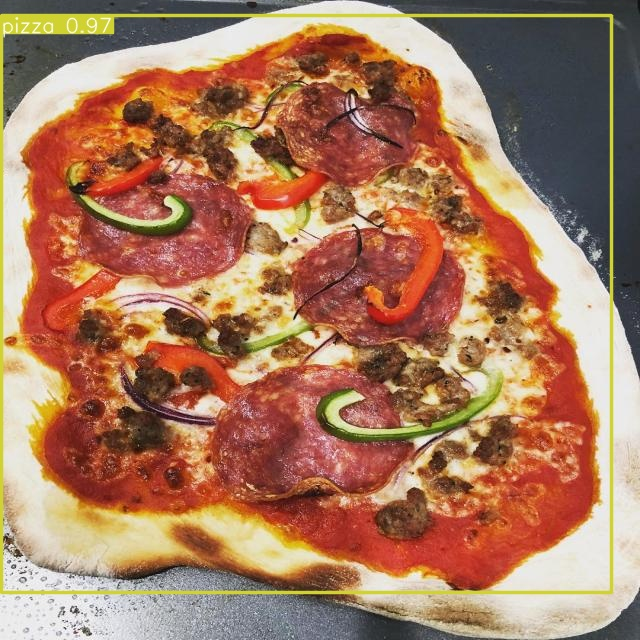

Objects detected : 1
Object type: pizza
Coordinates: [1.179931640625, 15.7808837890625, 611.56640625, 592.494384765625]
Probability: 0.9663523435592651
-------------------------
Image : 01002_jpg.rf.0af77673082c7476ee06c1e6f545196c.jpg


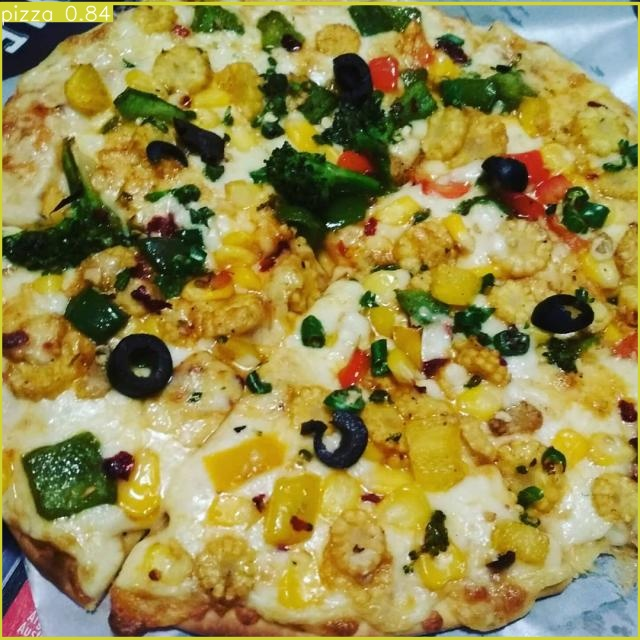

Objects detected : 1
Object type: pizza
Coordinates: [0.459228515625, 3.76025390625, 639.054931640625, 638.9422607421875]
Probability: 0.8438693284988403
-------------------------
Image : 01184_jpg.rf.3e4b81eefc4ccb787c280d416f6785ef.jpg


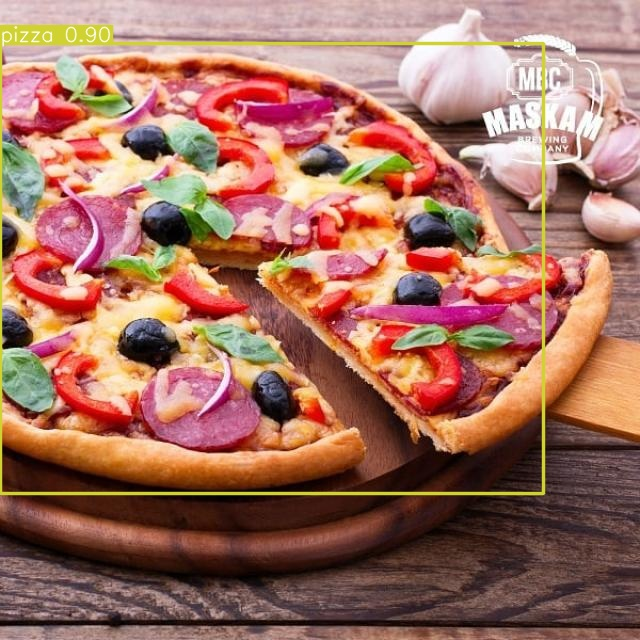

Objects detected : 1
Object type: pizza
Coordinates: [0.0, 43.24156188964844, 543.199462890625, 493.674072265625]
Probability: 0.9026404619216919
-------------------------
Image : 01277_jpg.rf.f6fae9d307f6af7d0c05c581278668bf.jpg


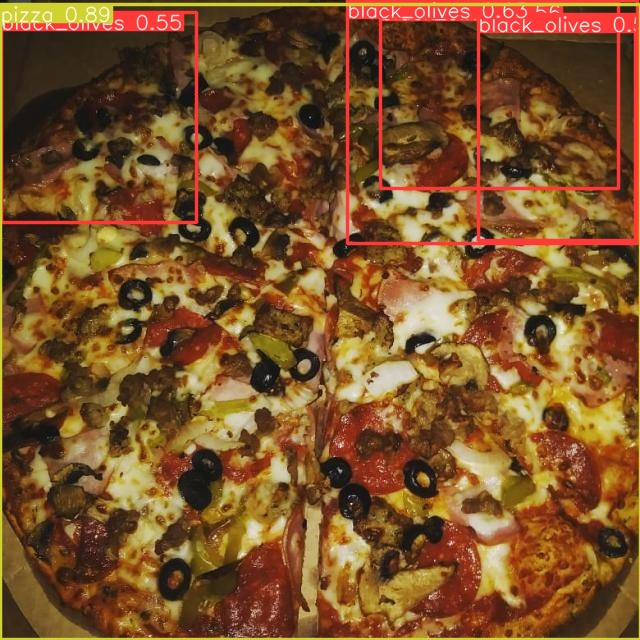

Objects detected : 5
Object type: pizza
Coordinates: [0.2333984375, 4.59942626953125, 640.0, 639.6192016601562]
Probability: 0.8889692425727844
-------------------------
Object type: black_olives
Coordinates: [347.20172119140625, 0.0, 637.7197265625, 243.45521545410156]
Probability: 0.6287765502929688
-------------------------
Object type: black_olives
Coordinates: [478.5538635253906, 14.230361938476562, 635.8555908203125, 240.46527099609375]
Probability: 0.5907069444656372
-------------------------
Object type: black_olives
Coordinates: [380.67413330078125, 2.1179962158203125, 618.9672241210938, 188.43165588378906]
Probability: 0.5596044063568115
-------------------------
Object type: black_olives
Coordinates: [1.107208251953125, 12.162490844726562, 196.74871826171875, 222.4364013671875]
Probability: 0.549050509929657
-------------------------
Image : 01580_jpg.rf.ebce8ed212770fa8e485a13c6ff657cf.jpg


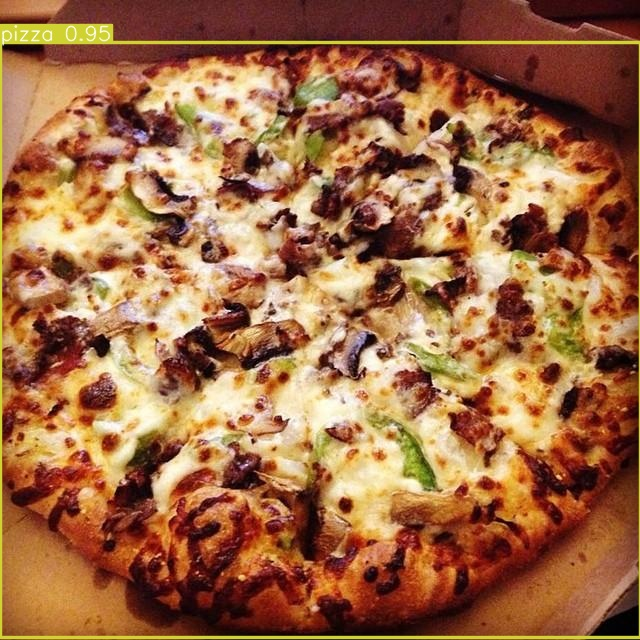

Objects detected : 1
Object type: pizza
Coordinates: [0.13128662109375, 42.015869140625, 640.0, 637.0081787109375]
Probability: 0.9461185932159424
-------------------------
Image : 01779_jpg.rf.4cabba5fec2738bcb3f95514219c2c6e.jpg


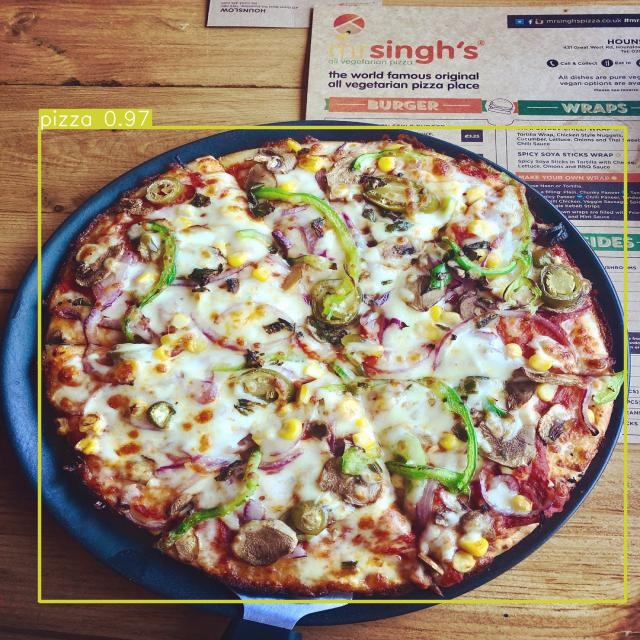

Objects detected : 1
Object type: pizza
Coordinates: [39.23291015625, 127.13751220703125, 625.0220947265625, 601.8812255859375]
Probability: 0.9683467745780945
-------------------------
Image : 01882_jpg.rf.446828f6a39267ebba639e6ecdfed1d8.jpg


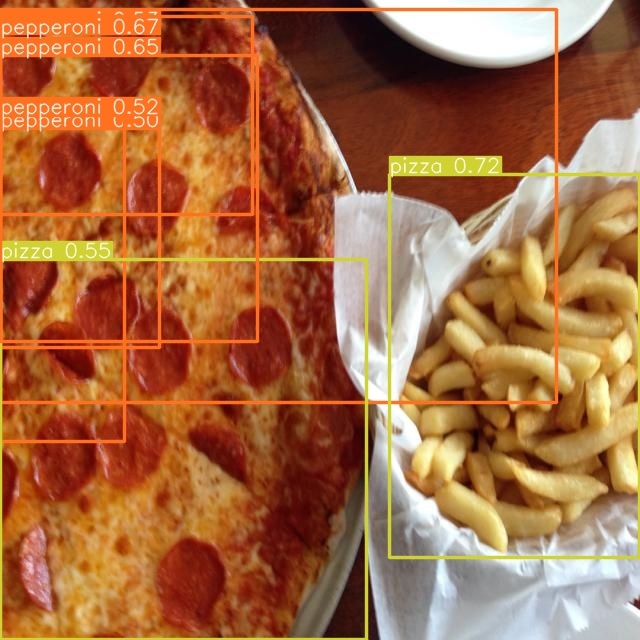

Objects detected : 7
Object type: pizza
Coordinates: [389.8363342285156, 174.6505126953125, 639.9156494140625, 557.3041381835938]
Probability: 0.7170456647872925
-------------------------
Object type: pepperoni
Coordinates: [0.0, 16.510009765625, 252.60086059570312, 214.02064514160156]
Probability: 0.6678241491317749
-------------------------
Object type: pepperoni
Coordinates: [0.0, 55.0596923828125, 257.23699951171875, 341.6038818359375]
Probability: 0.6513650417327881
-------------------------
Object type: pizza
Coordinates: [0.06341552734375, 259.93914794921875, 366.38671875, 639.3062133789062]
Probability: 0.5498849153518677
-------------------------
Object type: pepperoni
Coordinates: [0.0, 9.904266357421875, 556.9288330078125, 402.61834716796875]
Probability: 0.5293566584587097
-------------------------
Object type: pepperoni
Coordinates: [0.4879302978515625, 115.99806213378906, 124.24053955078125, 441.9725341796875]
Probability: 0.522699236869812
-------------------------
Objec

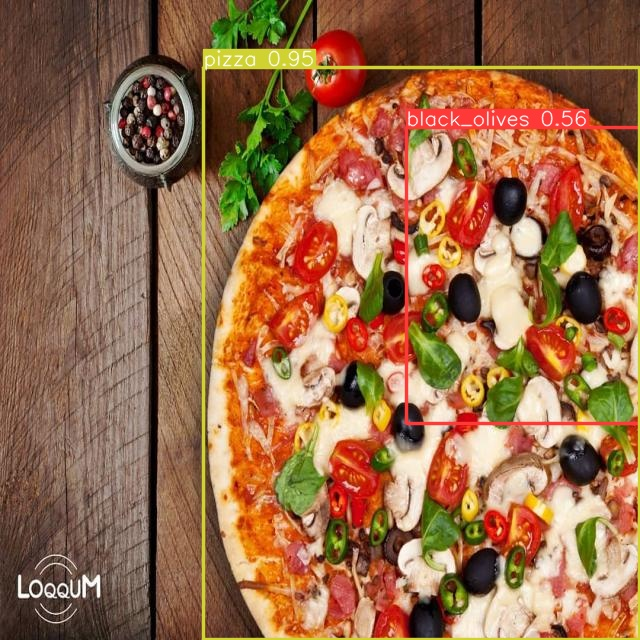

Objects detected : 2
Object type: pizza
Coordinates: [203.7010498046875, 67.23480224609375, 639.6875, 639.2351684570312]
Probability: 0.9457595348358154
-------------------------
Object type: black_olives
Coordinates: [406.95233154296875, 127.44346618652344, 640.0, 423.8953857421875]
Probability: 0.5554764270782471
-------------------------
Image : 02398_jpg.rf.67ed962d8f666decda9e2d0f5a804508.jpg


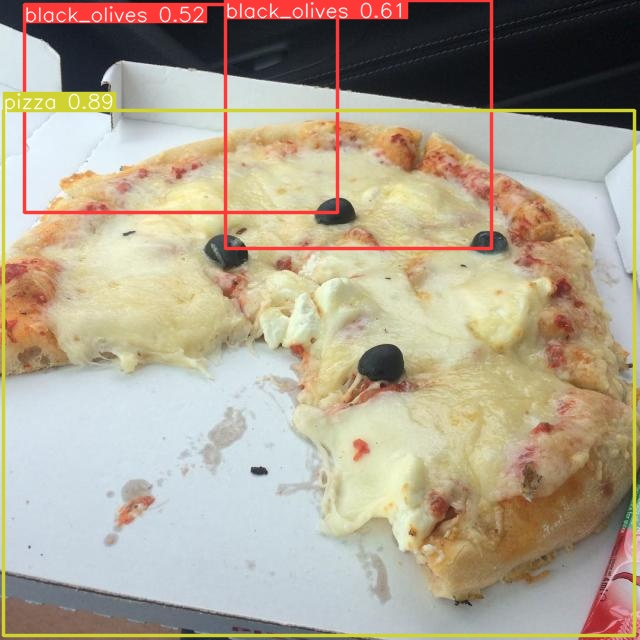

Objects detected : 3
Object type: pizza
Coordinates: [3.16259765625, 110.605712890625, 634.5714111328125, 635.0322265625]
Probability: 0.8943004608154297
-------------------------
Object type: black_olives
Coordinates: [225.30880737304688, 0.0, 491.9185485839844, 248.57904052734375]
Probability: 0.6062098145484924
-------------------------
Object type: black_olives
Coordinates: [24.349853515625, 4.4788970947265625, 337.1607971191406, 212.4842529296875]
Probability: 0.5240257382392883
-------------------------
Image : 02609_jpg.rf.766665cd486927227e0555c63a422530.jpg


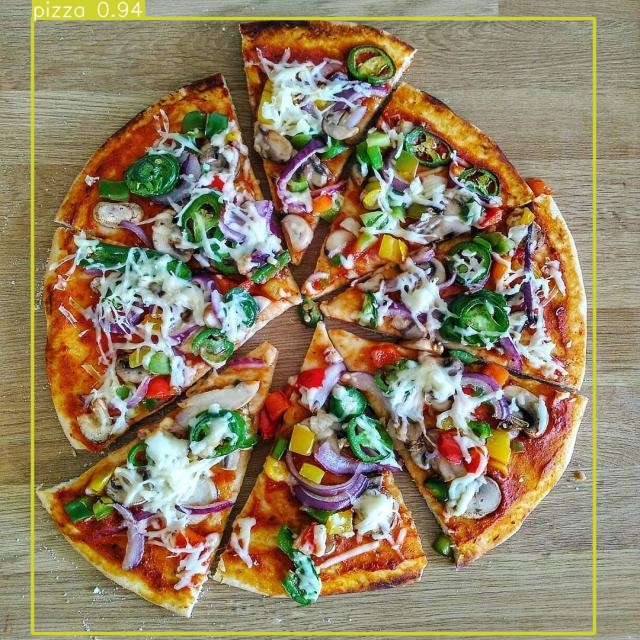

Objects detected : 1
Object type: pizza
Coordinates: [32.528076171875, 18.1048583984375, 594.8368530273438, 633.3048095703125]
Probability: 0.9356685280799866
-------------------------
Image : 02815_jpg.rf.e86a84ccacdad8c1f6d747c6ccb517de.jpg


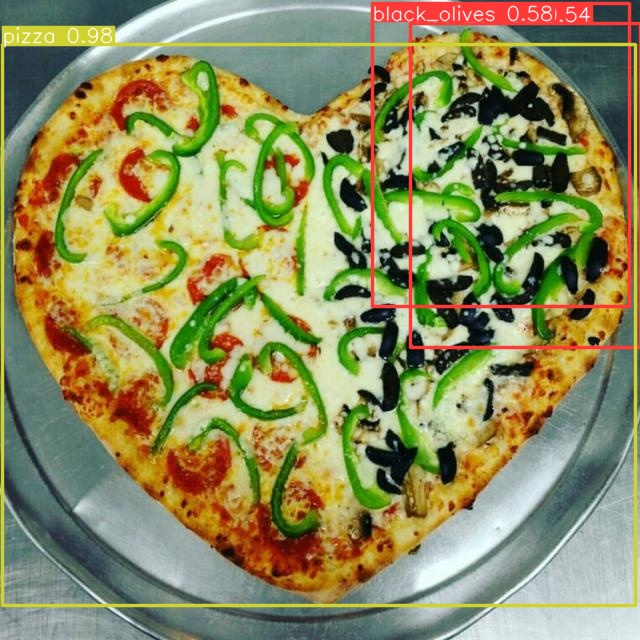

Objects detected : 3
Object type: pizza
Coordinates: [2.5489501953125, 44.30413818359375, 635.1678466796875, 605.772216796875]
Probability: 0.9753738045692444
-------------------------
Object type: black_olives
Coordinates: [372.602294921875, 3.03857421875, 629.8807373046875, 306.319580078125]
Probability: 0.5794379711151123
-------------------------
Object type: black_olives
Coordinates: [410.9287109375, 23.98822021484375, 640.0, 347.40106201171875]
Probability: 0.5381297469139099
-------------------------
Image : 03013_jpg.rf.84621f32eb54b57ba5b9b9e692be2742.jpg


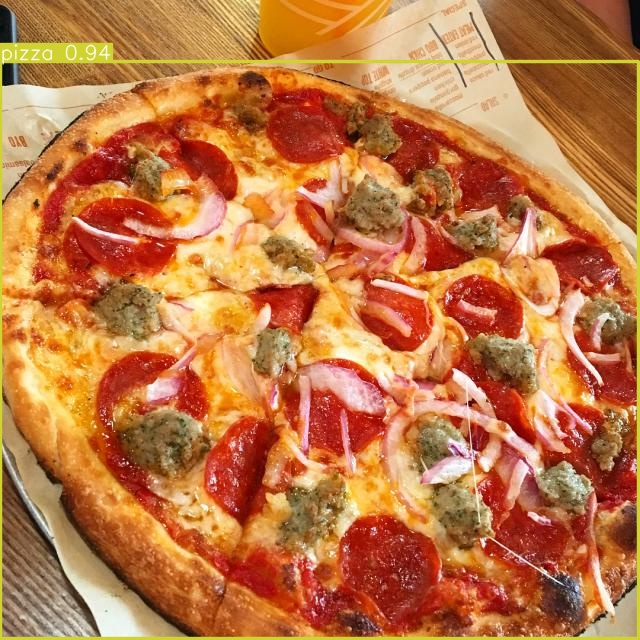

Objects detected : 1
Object type: pizza
Coordinates: [0.9571533203125, 61.19580078125, 638.81982421875, 638.1741943359375]
Probability: 0.9395603537559509
-------------------------
Image : 03649_jpg.rf.9f764261819c66d21f37ea616ebaad3d.jpg


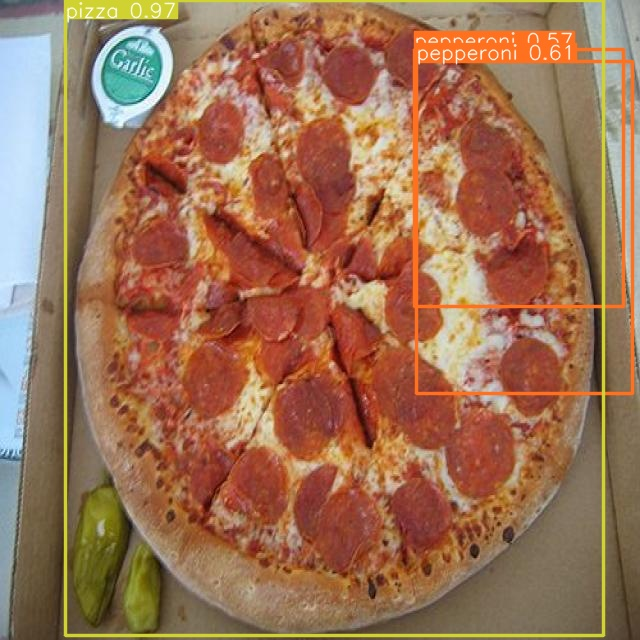

Objects detected : 3
Object type: pizza
Coordinates: [65.91229248046875, 0.8055419921875, 603.4730834960938, 635.517333984375]
Probability: 0.9691740870475769
-------------------------
Object type: pepperoni
Coordinates: [416.9701843261719, 61.976165771484375, 632.063232421875, 393.283203125]
Probability: 0.606015145778656
-------------------------
Object type: pepperoni
Coordinates: [414.2757568359375, 49.315460205078125, 623.81591796875, 306.9186096191406]
Probability: 0.5710988640785217
-------------------------
Image : 03730_jpg.rf.cfbc2d146260f8cdd7c62388c56c92ad.jpg


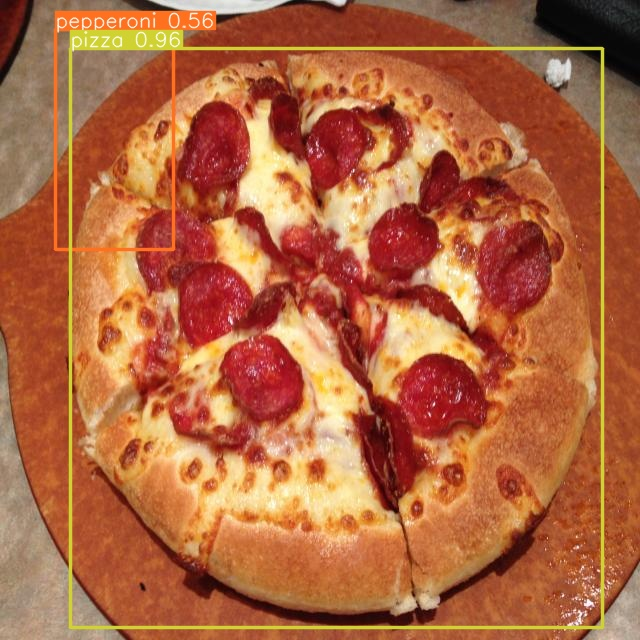

Objects detected : 2
Object type: pizza
Coordinates: [70.511474609375, 48.88525390625, 602.7457275390625, 627.830810546875]
Probability: 0.9629777669906616
-------------------------
Object type: pepperoni
Coordinates: [55.568721771240234, 29.910598754882812, 173.12899780273438, 249.81007385253906]
Probability: 0.5645319819450378
-------------------------
Image : 03737_jpg.rf.cf24965aa73230f19e47d3cdfb7a40c8.jpg


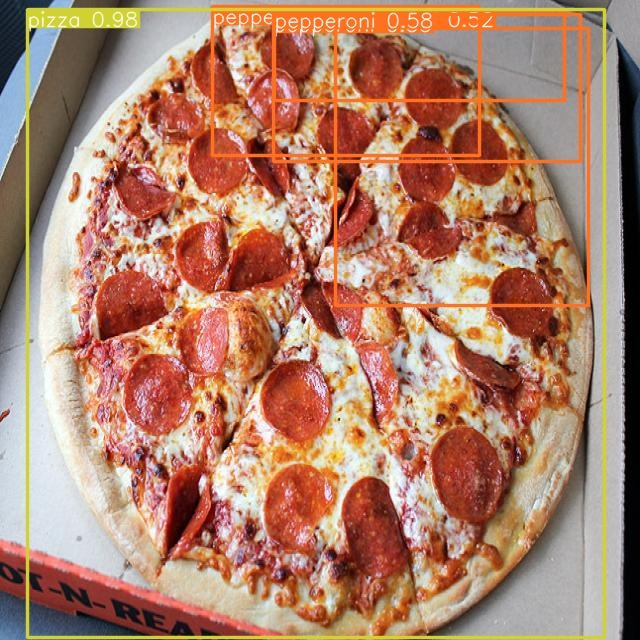

Objects detected : 5
Object type: pizza
Coordinates: [27.36334228515625, 9.73785400390625, 604.2948608398438, 637.0564575195312]
Probability: 0.9792041778564453
-------------------------
Object type: pepperoni
Coordinates: [274.95050048828125, 10.423110961914062, 564.1043090820312, 100.26911163330078]
Probability: 0.5766492486000061
-------------------------
Object type: pepperoni
Coordinates: [273.31561279296875, 14.504852294921875, 580.3703002929688, 161.33596801757812]
Probability: 0.5455751419067383
-------------------------
Object type: pepperoni
Coordinates: [212.05465698242188, 6.1990203857421875, 479.9245910644531, 155.0155029296875]
Probability: 0.526796281337738
-------------------------
Object type: pepperoni
Coordinates: [335.7861328125, 28.084228515625, 588.3939208984375, 305.8067626953125]
Probability: 0.5227453708648682
-------------------------
Image : 03786_jpg.rf.ec3879393bb09e50225531240db1c70e.jpg


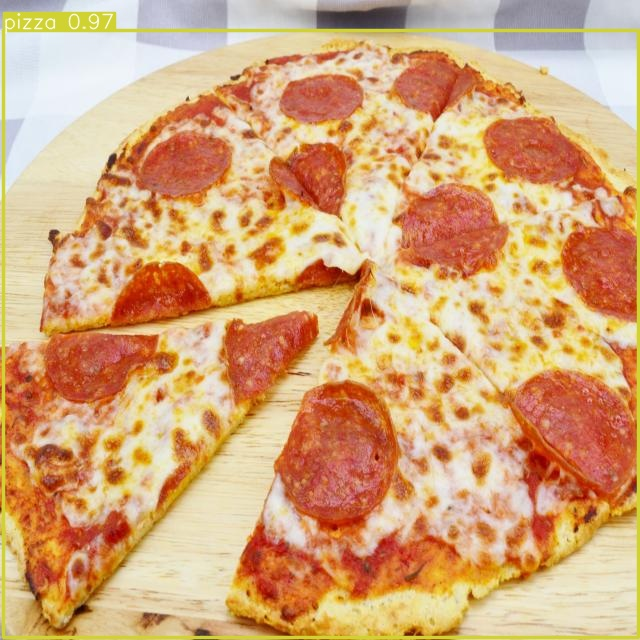

Objects detected : 1
Object type: pizza
Coordinates: [3.13580322265625, 30.933349609375, 638.8160400390625, 637.3671875]
Probability: 0.9695461392402649
-------------------------
Image : 03833_jpg.rf.22475954a8d0f4a17a57ca6a58b8d64d.jpg


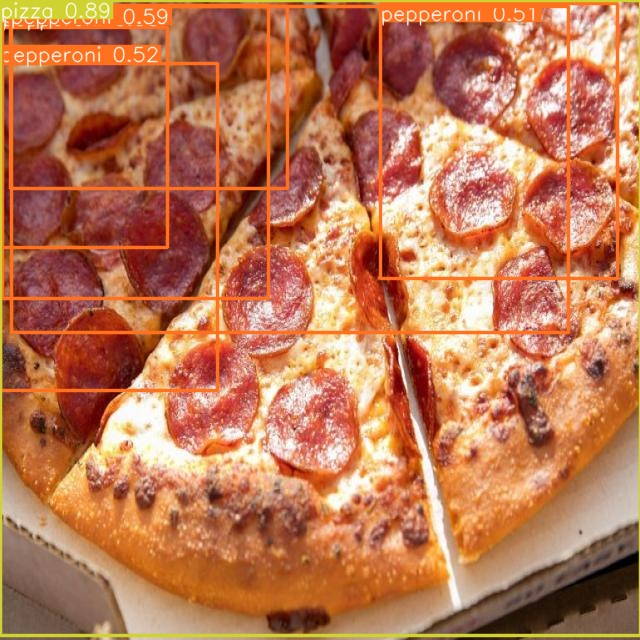

Objects detected : 7
Object type: pizza
Coordinates: [0.214111328125, 0.0, 640.0, 635.095947265625]
Probability: 0.8906461000442505
-------------------------
Object type: pepperoni
Coordinates: [10.470977783203125, 6.47674560546875, 287.91290283203125, 188.45721435546875]
Probability: 0.5928864479064941
-------------------------
Object type: pepperoni
Coordinates: [2.806732177734375, 5.791748046875, 268.8730773925781, 298.92181396484375]
Probability: 0.5860803723335266
-------------------------
Object type: pepperoni
Coordinates: [1.9718475341796875, 27.37774658203125, 167.113525390625, 247.48175048828125]
Probability: 0.547649085521698
-------------------------
Object type: pepperoni
Coordinates: [0.0, 63.9727783203125, 217.87728881835938, 390.8978576660156]
Probability: 0.51952064037323
-------------------------
Object type: pepperoni
Coordinates: [11.64178466796875, 6.30682373046875, 568.55419921875, 332.0977783203125]
Probability: 0.508589506149292
-------------------------
Object 

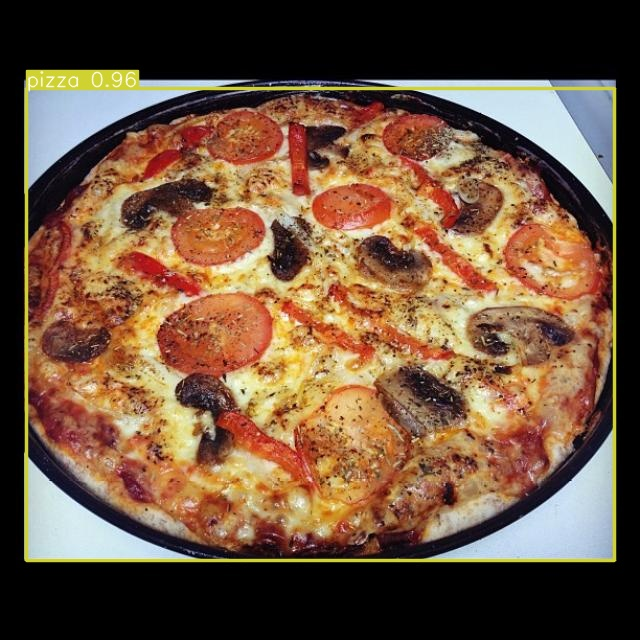

Objects detected : 1
Object type: pizza
Coordinates: [26.6036376953125, 88.81449890136719, 614.837158203125, 560.2293090820312]
Probability: 0.9643135666847229
-------------------------
Image : 04658_jpg.rf.7bd2c30ebdc3ec8eec2812972d7bb7da.jpg


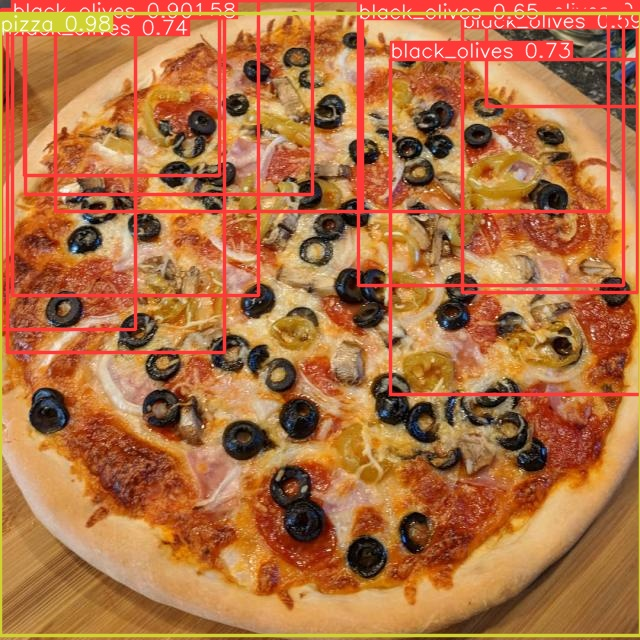

Objects detected : 12
Object type: pizza
Coordinates: [0.0, 13.95855712890625, 640.0, 635.583740234375]
Probability: 0.9766486287117004
-------------------------
Object type: black_olives
Coordinates: [12.767051696777344, 0.0, 258.5015563964844, 295.5799560546875]
Probability: 0.8989019393920898
-------------------------
Object type: black_olives
Coordinates: [7.32696533203125, 17.8778076171875, 224.94778442382812, 352.7605285644531]
Probability: 0.7359410524368286
-------------------------
Object type: black_olives
Coordinates: [390.46820068359375, 59.5836181640625, 640.0, 394.7640686035156]
Probability: 0.7345743775367737
-------------------------
Object type: black_olives
Coordinates: [358.919921875, 1.6046142578125, 623.216064453125, 285.64154052734375]
Probability: 0.6510663032531738
-------------------------
Object type: black_olives
Coordinates: [25.395599365234375, 0.0, 312.8596496582031, 194.77865600585938]
Probability: 0.614646315574646
-------------------------
Object type: 

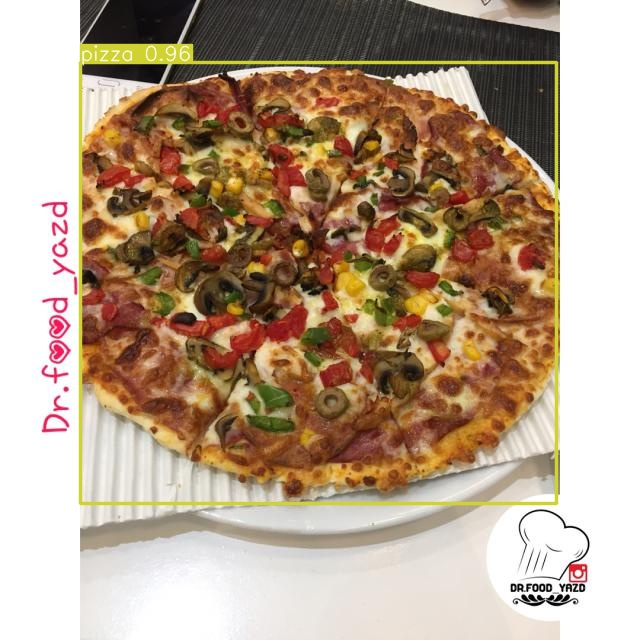

Objects detected : 1
Object type: pizza
Coordinates: [80.169677734375, 62.14079284667969, 556.7998046875, 503.71966552734375]
Probability: 0.9619172215461731
-------------------------
Image : 04796_jpg.rf.2f8dcc3929034ebbf889a389b586873d.jpg


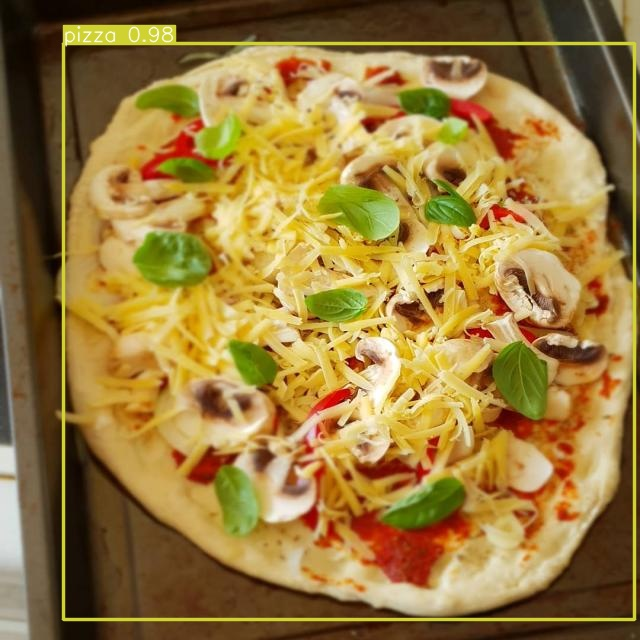

Objects detected : 1
Object type: pizza
Coordinates: [63.71246337890625, 43.7061767578125, 634.8275146484375, 619.822265625]
Probability: 0.9753638505935669
-------------------------
Image : 05159_jpg.rf.3084103e54f65258df42b4ef697cc818.jpg


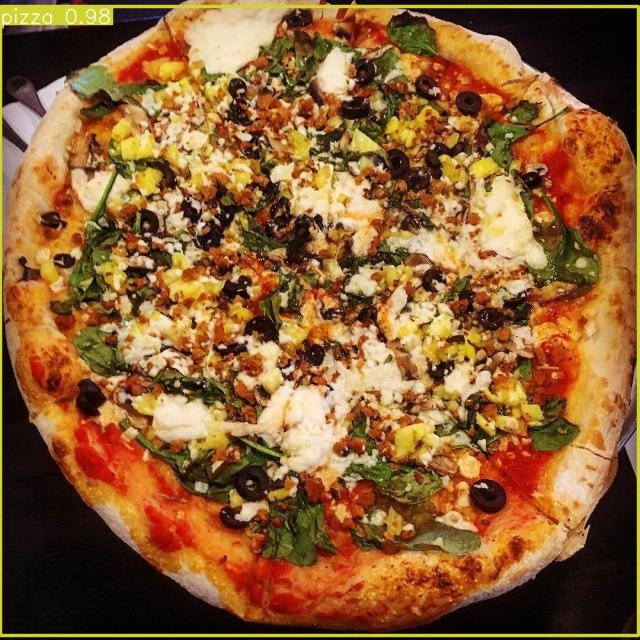

Objects detected : 1
Object type: pizza
Coordinates: [0.0, 6.4053955078125, 638.07958984375, 635.8541259765625]
Probability: 0.9824585318565369
-------------------------
Image : 05335_jpg.rf.ec51189b93eb327f0b4408d40d2c3b7a.jpg


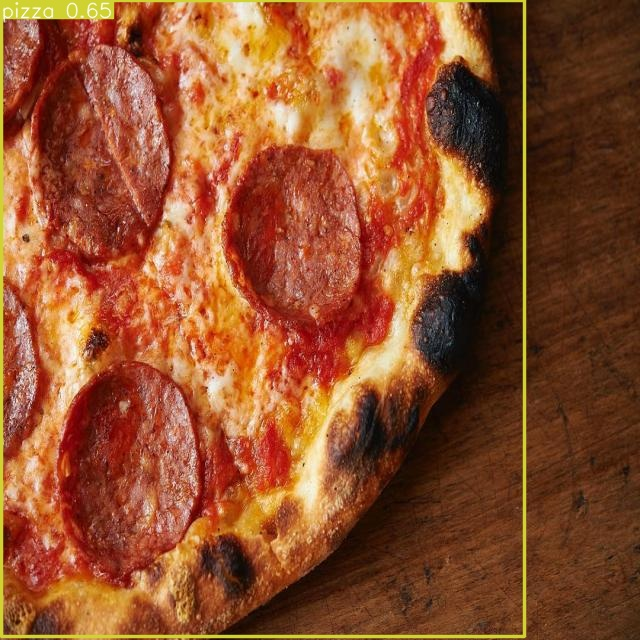

Objects detected : 1
Object type: pizza
Coordinates: [1.79180908203125, 0.43499755859375, 524.9769897460938, 636.4026489257812]
Probability: 0.6546218991279602
-------------------------
Image : 05421_jpg.rf.c4e363e7bc4ab96153befd8a3e07b120.jpg


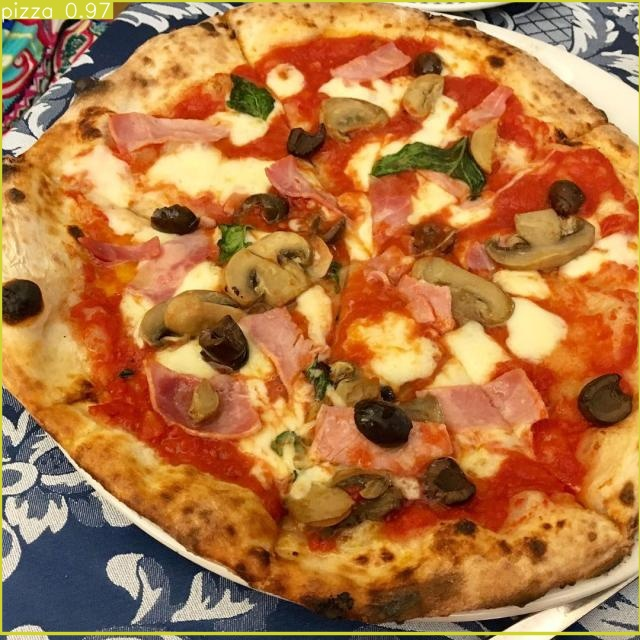

Objects detected : 1
Object type: pizza
Coordinates: [0.588134765625, 0.0, 640.0, 633.7071533203125]
Probability: 0.9655760526657104
-------------------------
Image : 05507_jpg.rf.09c34b918e540dc905f8542030c74aac.jpg


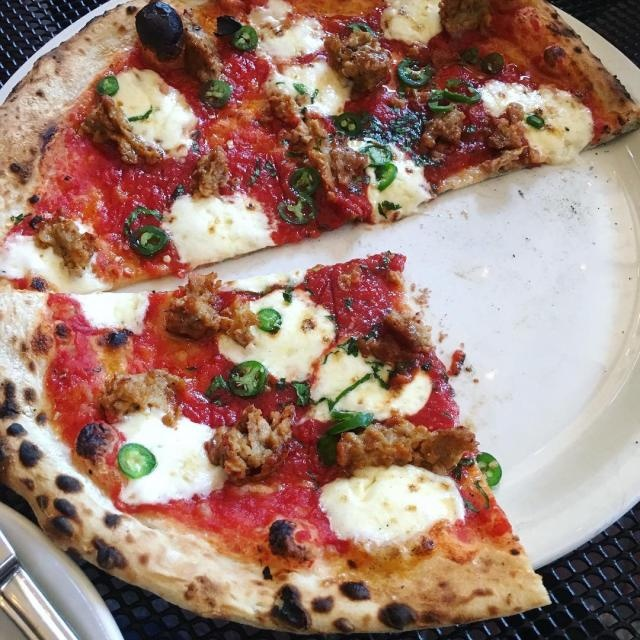

Objects detected : 0
Image : 06960_jpg.rf.afb47406d39088b9b456ece109f71e4b.jpg


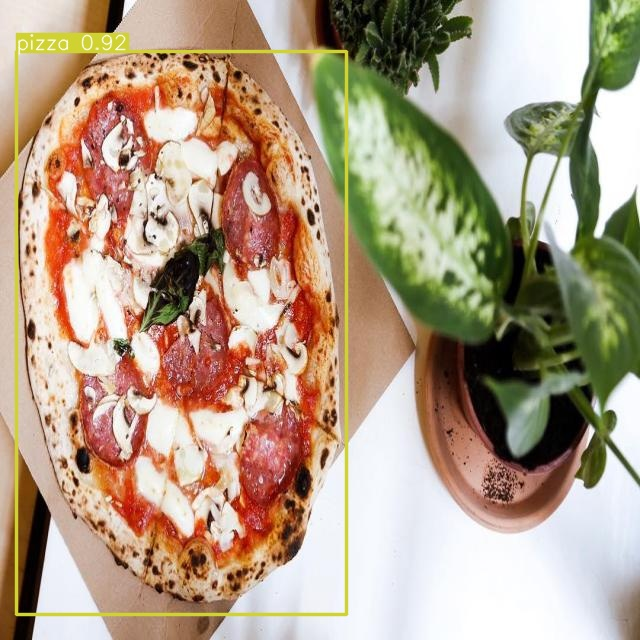

Objects detected : 1
Object type: pizza
Coordinates: [16.77825927734375, 51.4185791015625, 346.2816467285156, 614.642578125]
Probability: 0.9156301617622375
-------------------------
Image : 07022_jpg.rf.18528ffa1d5fb7478a9638fd7ef4e844.jpg


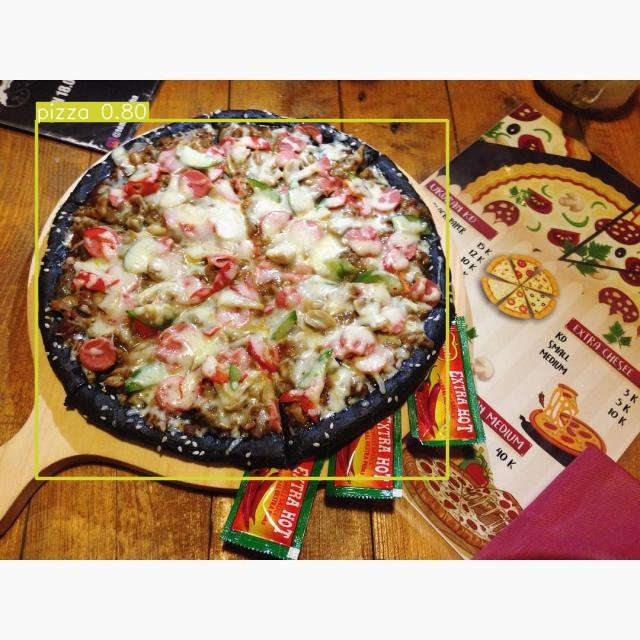

Objects detected : 1
Object type: pizza
Coordinates: [36.794403076171875, 120.26480102539062, 447.70318603515625, 478.4537048339844]
Probability: 0.8042700886726379
-------------------------
Image : 07210_jpg.rf.dc0c84cbcb2b1d77cd7eb6400c97fcf3.jpg


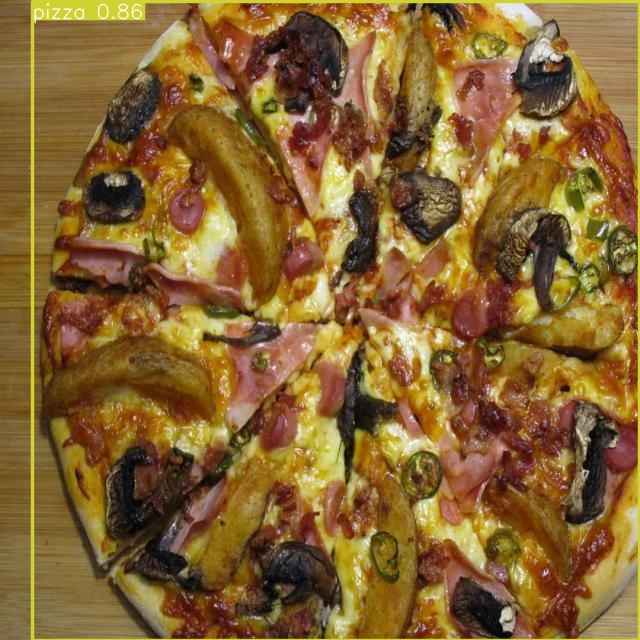

Objects detected : 1
Object type: pizza
Coordinates: [32.4166259765625, 1.86810302734375, 639.764892578125, 640.0]
Probability: 0.857921838760376
-------------------------
Image : 08250_jpg.rf.01fb511f5b0ca0de6c819d1705b05019.jpg


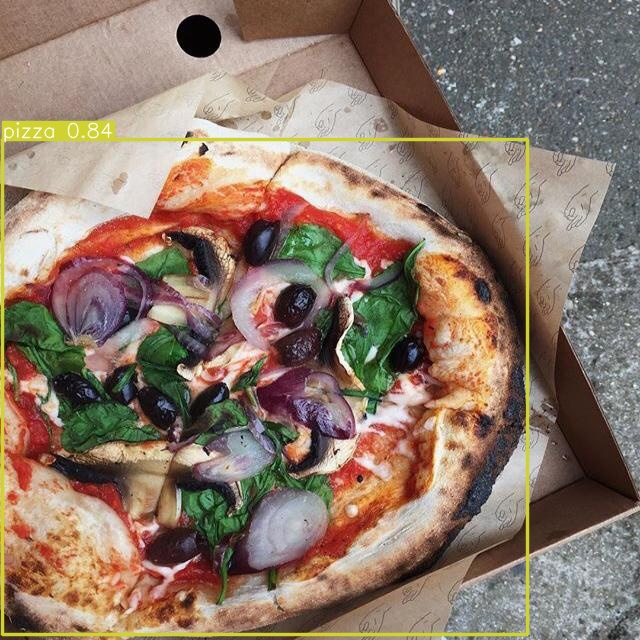

Objects detected : 1
Object type: pizza
Coordinates: [2.13299560546875, 139.2825469970703, 527.0159301757812, 634.6538696289062]
Probability: 0.8359296321868896
-------------------------
Image : 08338_jpg.rf.5ab264c365b0a3c7faa5353e5745c83e.jpg


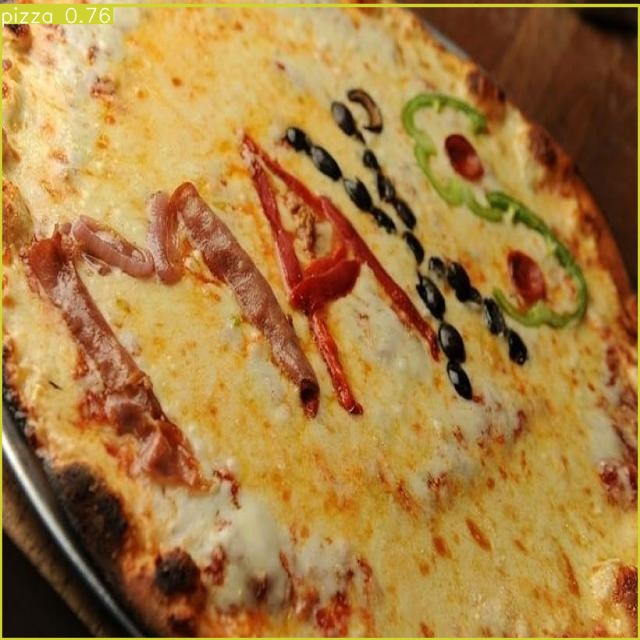

Objects detected : 1
Object type: pizza
Coordinates: [0.33551025390625, 5.49169921875, 639.0535278320312, 639.4466552734375]
Probability: 0.7613033056259155
-------------------------
Image : 08898_jpg.rf.85cfa3a24b60dfc4eb6f1f91b2a2b5fc.jpg


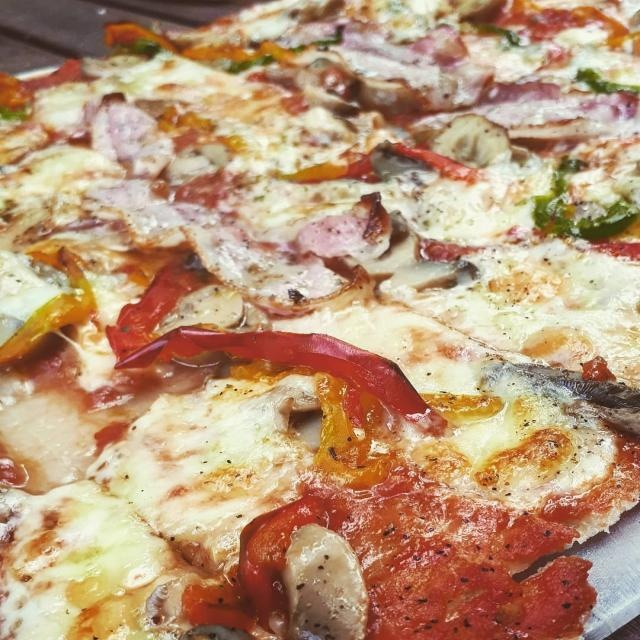

Objects detected : 0
Image : 08957_jpg.rf.ac8622688b07d4f3e811753c3a287963.jpg


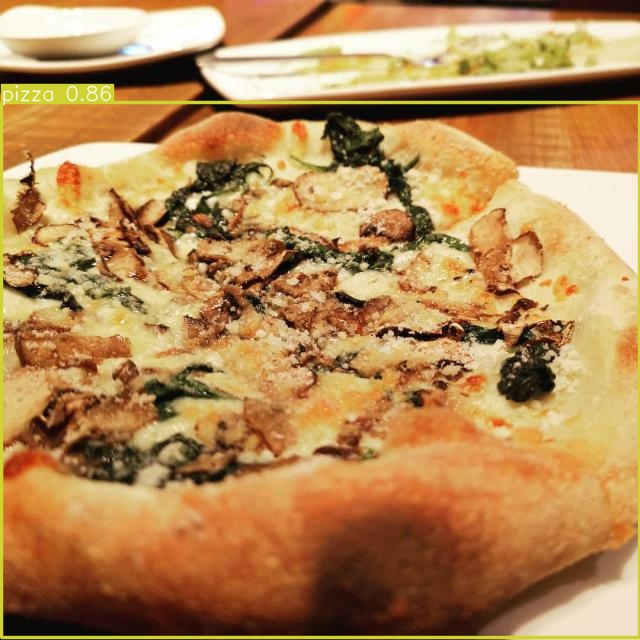

Objects detected : 1
Object type: pizza
Coordinates: [1.16094970703125, 102.92974853515625, 639.8362426757812, 637.23046875]
Probability: 0.8608829379081726
-------------------------


In [111]:
# Looping through results

pred_dir_path = '/home/kcini75/Notebooks/ARI3129_Computer_vision/runs/detect/predict/'

for n in range(len(yolo_predictions)):
    result = yolo_predictions[n]
    img_path = result.path
    filename = os.path.basename(img_path)
    pred_path = os.path.join(pred_dir_path, filename)
    print(f'Image : {filename}')
    display(Image(filename=pred_path, width=240))
    objs_det = len(result.boxes)
    print(f'Objects detected : {objs_det}')
    
    for o in range(objs_det):
        box = result.boxes[o]
        print("Object type:", result.names[box.cls[0].item()])
        print("Coordinates:", box.xyxy[0].tolist())
        print("Probability:", box.conf[0].item())
        print('-------------------------')



#### **References**

[1] https://towardsdatascience.com/understanding-and-implementing-faster-r-cnn-a-step-by-step-guide-11acfff216b0 <br>
[2] https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov8-object-detection-on-custom-dataset.ipynb#scrollTo=tdSMcABDNKW- <br>
[3] https://towardsdatascience.com/on-object-detection-metrics-with-worked-example-216f173ed31e